# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

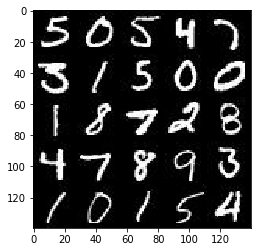

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

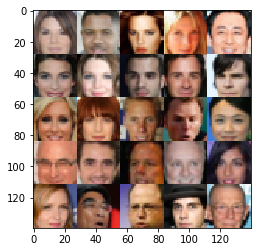

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

/home/ubuntu/anaconda3/envs/tensorflow_p36/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: compiletime version 3.5 of module 'tensorflow.python.framework.fast_tensor_util' does not match runtime version 3.6
  return f(*args, **kwds)


TensorFlow Version: 1.4.0
Default GPU Device: /device:GPU:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    real = tf.placeholder(tf.float32, [None, image_width, image_height, image_channels])
    z = tf.placeholder(tf.float32, [None, z_dim])
    lr = tf.placeholder(tf.float32)
    
    return real, z, lr


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    with tf.variable_scope('discriminator', reuse=reuse):
        alpha = 0.2
        keep_prob = 0.5
        # Input layer is 28x28x3
        
        # Conv Layer - 14*14*56
        conv_layer = tf.layers.conv2d(images,56, 5, strides=(2,2), padding='SAME', use_bias=True,
                                     kernel_initializer=tf.contrib.layers.xavier_initializer())
        conv_layer = tf.maximum(alpha * conv_layer, conv_layer)
        # Now 14*14*56
        
        # Conv Layer - 7*7*80
        conv_layer = tf.layers.conv2d(conv_layer, 80, 5, strides=(2,2), padding='SAME', use_bias=False,
                                     kernel_initializer=tf.contrib.layers.xavier_initializer())
        conv_layer = tf.layers.batch_normalization(conv_layer, training=True)
        #Add dropout
        conv_layer = tf.contrib.layers.dropout(conv_layer, keep_prob, is_training=True)
        conv_layer = tf.maximum(alpha * conv_layer, conv_layer)
        #Now 7*7*80
        
        # Conv Layer - 4*4*128
        conv_layer = tf.layers.conv2d(conv_layer, 128, 5, strides=(2,2), padding='SAME', use_bias=False,
                                     kernel_initializer=tf.contrib.layers.xavier_initializer())
        conv_layer = tf.layers.batch_normalization(conv_layer, training=True)
        #Add dropout
        conv_layer = tf.contrib.layers.dropout(conv_layer, keep_prob, is_training=True)
        conv_layer = tf.maximum(alpha * conv_layer, conv_layer)
        #Now 4*4*128
        
        flat = tf.reshape(conv_layer, (-1, 4*4*128))

        logits = tf.layers.dense(flat, 1)
        
        out = tf.sigmoid(logits)
        
        return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    with tf.variable_scope('generator', reuse=not(is_train)):
        keep_prob = 0.8
        
        # layer 1 - Dense Layer
        x = tf.layers.dense(z, 3*3*512, use_bias=True, activation=None)
        x = tf.reshape(x, (-1, 3, 3, 512))
        x = tf.layers.batch_normalization(x, training=is_train)
        # Relu as per DCGAN paper
        x = tf.nn.relu(x)

        #Conv Layer - 4*4*320
        strides=1
        conv_layer = tf.layers.conv2d_transpose(x, 320, 2, strides, 'valid', use_bias=False, activation=None, 
                                                kernel_initializer=tf.contrib.layers.xavier_initializer())
        conv_layer = tf.layers.batch_normalization(conv_layer, training=is_train)
        
        #Add dropout
        conv_layer = tf.contrib.layers.dropout(conv_layer, keep_prob, is_training=is_train)
        # Relu as per DCGAN paper
        conv_layer = tf.nn.relu(conv_layer)


        #Conv Layer - 7*7*256
        strides=1
        conv_layer = tf.layers.conv2d_transpose(conv_layer, 256, 4, strides, 'valid', use_bias=False, activation=None, 
                                                kernel_initializer=tf.contrib.layers.xavier_initializer())
        conv_layer = tf.layers.batch_normalization(conv_layer, training=is_train)
        #Add dropout
        conv_layer = tf.contrib.layers.dropout(conv_layer, keep_prob, is_training=is_train)
        # Relu as per DCGAN paper
        conv_layer = tf.nn.relu(conv_layer)
        
        
        #Conv Layer - 14*14*128
        strides=2
        conv_layer = tf.layers.conv2d_transpose(conv_layer, 128,5, strides, 'same', use_bias=False, activation=None,
                                               kernel_initializer=tf.contrib.layers.xavier_initializer())
        conv_layer = tf.layers.batch_normalization(conv_layer, training=is_train)
        #Add dropout
        conv_layer = tf.contrib.layers.dropout(conv_layer, keep_prob, is_training=is_train)
        # Relu as per DCGAN paper
        conv_layer = tf.nn.relu(conv_layer)
        

        #Logits - Conv Layer - 28,28,3 
        logits = tf.layers.conv2d_transpose(conv_layer, out_channel_dim,5, strides, 'same', use_bias=True, activation=None,
                                           kernel_initializer=tf.contrib.layers.xavier_initializer())
        
        # tanh output
        out = tf.tanh(logits)
        
        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim, is_train=True)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    d_l_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_l_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_l_real + d_l_fake

    return d_loss, g_loss
    

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    import numpy as np
    show= 120
    print_=10

    input_real, input_z, lr = model_inputs(data_shape[1],data_shape[2],data_shape[3], z_dim)

    d_loss, g_loss = model_loss(input_real, input_z, data_shape[3])
        
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    iterations=0
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                
                batch_images = batch_images * 2
                
                # TODO: Train Model
                # Sample random noise
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z, lr:learning_rate})
                _ = sess.run(g_opt, feed_dict={input_z: batch_z, input_real: batch_images,lr:learning_rate})
                
                #show_generator_output(sess, 1, input_z, data_shape[3], data_image_mode)
                
                if iterations % print_ ==0:
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})
                    
                    print("Epoch {}/{}...".format(epoch_i+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))                
                iterations+=1
                if iterations % show == 0:
                    show_generator_output(sess, 58, input_z, data_shape[3], data_image_mode)
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})
        print("Final : Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))                
        show_generator_output(sess, 58, input_z, data_shape[3], data_image_mode)                
 

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 2.4204... Generator Loss: 0.1443
Epoch 1/2... Discriminator Loss: 2.8941... Generator Loss: 0.1603
Epoch 1/2... Discriminator Loss: 0.3161... Generator Loss: 4.0959
Epoch 1/2... Discriminator Loss: 0.6498... Generator Loss: 1.6117
Epoch 1/2... Discriminator Loss: 2.4517... Generator Loss: 0.3041
Epoch 1/2... Discriminator Loss: 2.2288... Generator Loss: 0.3417
Epoch 1/2... Discriminator Loss: 0.7539... Generator Loss: 3.2216
Epoch 1/2... Discriminator Loss: 0.4399... Generator Loss: 2.0405
Epoch 1/2... Discriminator Loss: 1.8927... Generator Loss: 7.2800
Epoch 1/2... Discriminator Loss: 0.6039... Generator Loss: 2.4860
Epoch 1/2... Discriminator Loss: 0.8084... Generator Loss: 0.7329
Epoch 1/2... Discriminator Loss: 1.2569... Generator Loss: 0.9750


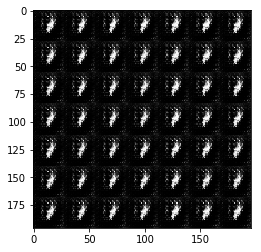

Epoch 1/2... Discriminator Loss: 1.7789... Generator Loss: 0.4441
Epoch 1/2... Discriminator Loss: 0.3451... Generator Loss: 2.0760
Epoch 1/2... Discriminator Loss: 2.6551... Generator Loss: 0.1738
Epoch 1/2... Discriminator Loss: 0.3241... Generator Loss: 1.4053
Epoch 1/2... Discriminator Loss: 1.5387... Generator Loss: 0.4518
Epoch 1/2... Discriminator Loss: 0.7466... Generator Loss: 1.3338
Epoch 1/2... Discriminator Loss: 0.8071... Generator Loss: 1.1407
Epoch 1/2... Discriminator Loss: 0.8231... Generator Loss: 1.9385
Epoch 1/2... Discriminator Loss: 1.8648... Generator Loss: 1.5752
Epoch 1/2... Discriminator Loss: 2.0556... Generator Loss: 0.5558
Epoch 1/2... Discriminator Loss: 2.3357... Generator Loss: 0.2779
Epoch 1/2... Discriminator Loss: 0.7416... Generator Loss: 1.2017


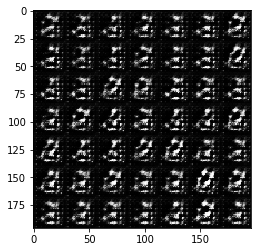

Epoch 1/2... Discriminator Loss: 1.0446... Generator Loss: 0.9792
Epoch 1/2... Discriminator Loss: 2.7160... Generator Loss: 0.4042
Epoch 1/2... Discriminator Loss: 1.0308... Generator Loss: 1.2160
Epoch 1/2... Discriminator Loss: 1.0084... Generator Loss: 1.4488
Epoch 1/2... Discriminator Loss: 0.9123... Generator Loss: 1.0261
Epoch 1/2... Discriminator Loss: 1.2028... Generator Loss: 0.5510
Epoch 1/2... Discriminator Loss: 1.8600... Generator Loss: 0.4903
Epoch 1/2... Discriminator Loss: 1.8051... Generator Loss: 1.1002
Epoch 1/2... Discriminator Loss: 0.8574... Generator Loss: 1.8548
Epoch 1/2... Discriminator Loss: 1.4176... Generator Loss: 0.5615
Epoch 1/2... Discriminator Loss: 1.1841... Generator Loss: 0.7599
Epoch 1/2... Discriminator Loss: 1.0870... Generator Loss: 1.7139


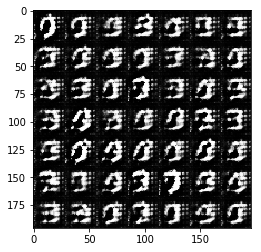

Epoch 1/2... Discriminator Loss: 1.4246... Generator Loss: 1.2907
Epoch 1/2... Discriminator Loss: 1.3102... Generator Loss: 1.0541
Epoch 1/2... Discriminator Loss: 1.0667... Generator Loss: 0.8642
Epoch 1/2... Discriminator Loss: 1.3675... Generator Loss: 0.6627
Epoch 1/2... Discriminator Loss: 1.3153... Generator Loss: 1.2745
Epoch 1/2... Discriminator Loss: 1.2156... Generator Loss: 0.9874
Epoch 1/2... Discriminator Loss: 0.7172... Generator Loss: 1.3675
Epoch 1/2... Discriminator Loss: 1.2520... Generator Loss: 0.8010
Epoch 1/2... Discriminator Loss: 1.3431... Generator Loss: 1.1150
Epoch 1/2... Discriminator Loss: 1.0925... Generator Loss: 1.0531
Epoch 1/2... Discriminator Loss: 1.3859... Generator Loss: 0.8281
Epoch 1/2... Discriminator Loss: 1.0324... Generator Loss: 1.0773


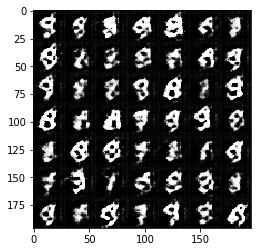

Epoch 1/2... Discriminator Loss: 1.6323... Generator Loss: 1.0164
Epoch 1/2... Discriminator Loss: 0.8322... Generator Loss: 1.1741
Epoch 1/2... Discriminator Loss: 0.7920... Generator Loss: 1.2180
Epoch 1/2... Discriminator Loss: 1.3421... Generator Loss: 0.9611
Epoch 1/2... Discriminator Loss: 1.1100... Generator Loss: 1.0376
Epoch 1/2... Discriminator Loss: 1.0498... Generator Loss: 0.8846
Epoch 1/2... Discriminator Loss: 1.2661... Generator Loss: 1.0057
Epoch 1/2... Discriminator Loss: 0.9365... Generator Loss: 1.1334
Epoch 1/2... Discriminator Loss: 1.1564... Generator Loss: 1.9246
Epoch 1/2... Discriminator Loss: 1.5843... Generator Loss: 0.7476
Epoch 1/2... Discriminator Loss: 0.9112... Generator Loss: 1.4990
Epoch 1/2... Discriminator Loss: 1.0902... Generator Loss: 1.3898


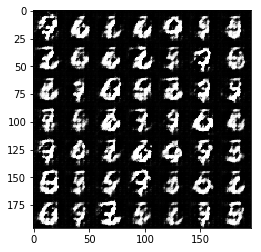

Epoch 1/2... Discriminator Loss: 1.6525... Generator Loss: 0.6589
Epoch 1/2... Discriminator Loss: 0.9250... Generator Loss: 1.5571
Epoch 1/2... Discriminator Loss: 1.1860... Generator Loss: 1.1107
Epoch 1/2... Discriminator Loss: 1.2066... Generator Loss: 0.7712
Epoch 1/2... Discriminator Loss: 1.1416... Generator Loss: 0.7983
Epoch 1/2... Discriminator Loss: 0.9126... Generator Loss: 1.5473
Epoch 1/2... Discriminator Loss: 1.3840... Generator Loss: 0.4674
Epoch 1/2... Discriminator Loss: 1.3145... Generator Loss: 1.4121
Epoch 1/2... Discriminator Loss: 1.3637... Generator Loss: 0.6273
Epoch 1/2... Discriminator Loss: 1.4266... Generator Loss: 1.5443
Epoch 1/2... Discriminator Loss: 1.3122... Generator Loss: 0.6644
Epoch 1/2... Discriminator Loss: 1.2948... Generator Loss: 0.6722


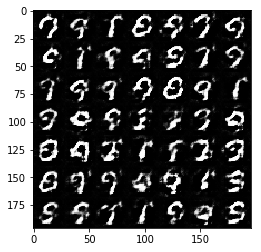

Epoch 1/2... Discriminator Loss: 1.4529... Generator Loss: 1.2094
Epoch 1/2... Discriminator Loss: 1.4773... Generator Loss: 1.1724
Epoch 1/2... Discriminator Loss: 0.9572... Generator Loss: 1.1645
Epoch 1/2... Discriminator Loss: 1.0482... Generator Loss: 1.6508
Epoch 1/2... Discriminator Loss: 1.1715... Generator Loss: 0.6167
Epoch 1/2... Discriminator Loss: 1.7333... Generator Loss: 0.5792
Epoch 1/2... Discriminator Loss: 1.2866... Generator Loss: 0.9640
Epoch 1/2... Discriminator Loss: 0.7412... Generator Loss: 1.5553
Epoch 1/2... Discriminator Loss: 0.8335... Generator Loss: 1.3358
Epoch 1/2... Discriminator Loss: 1.1855... Generator Loss: 1.3491
Epoch 1/2... Discriminator Loss: 1.4469... Generator Loss: 0.7980
Epoch 1/2... Discriminator Loss: 1.3524... Generator Loss: 0.8161


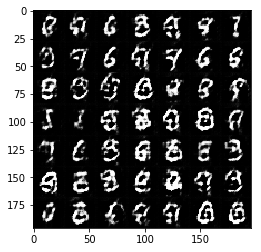

Epoch 1/2... Discriminator Loss: 1.5449... Generator Loss: 1.1703
Epoch 1/2... Discriminator Loss: 0.9992... Generator Loss: 1.8473
Epoch 1/2... Discriminator Loss: 1.5979... Generator Loss: 0.6155
Epoch 1/2... Discriminator Loss: 1.2129... Generator Loss: 0.8722
Epoch 1/2... Discriminator Loss: 1.4053... Generator Loss: 1.2110
Epoch 1/2... Discriminator Loss: 0.9677... Generator Loss: 0.9512
Epoch 1/2... Discriminator Loss: 1.5783... Generator Loss: 0.5436
Epoch 1/2... Discriminator Loss: 1.3545... Generator Loss: 1.1202
Epoch 1/2... Discriminator Loss: 1.8612... Generator Loss: 1.3681
Epoch 1/2... Discriminator Loss: 1.4133... Generator Loss: 0.7009
Epoch 1/2... Discriminator Loss: 1.1888... Generator Loss: 0.9292
Epoch 1/2... Discriminator Loss: 1.1672... Generator Loss: 1.0726


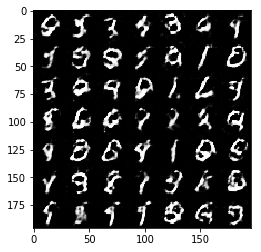

Epoch 1/2... Discriminator Loss: 1.2727... Generator Loss: 1.0774
Epoch 1/2... Discriminator Loss: 1.1867... Generator Loss: 0.9152
Epoch 1/2... Discriminator Loss: 1.2985... Generator Loss: 1.2092
Epoch 1/2... Discriminator Loss: 0.9912... Generator Loss: 0.9096
Epoch 1/2... Discriminator Loss: 1.3480... Generator Loss: 1.1144
Epoch 1/2... Discriminator Loss: 1.4220... Generator Loss: 0.8877
Epoch 1/2... Discriminator Loss: 1.6399... Generator Loss: 1.0764
Epoch 1/2... Discriminator Loss: 1.2165... Generator Loss: 0.8204
Epoch 1/2... Discriminator Loss: 1.2113... Generator Loss: 0.8331
Epoch 1/2... Discriminator Loss: 1.0574... Generator Loss: 1.2394
Epoch 1/2... Discriminator Loss: 1.4616... Generator Loss: 1.0737
Epoch 1/2... Discriminator Loss: 1.6560... Generator Loss: 0.7557


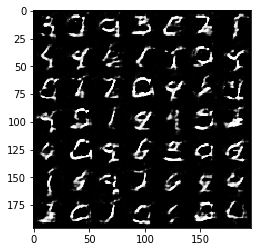

Epoch 1/2... Discriminator Loss: 1.1712... Generator Loss: 1.2114
Epoch 1/2... Discriminator Loss: 1.4792... Generator Loss: 0.8534
Epoch 1/2... Discriminator Loss: 1.3934... Generator Loss: 1.1626
Epoch 1/2... Discriminator Loss: 0.9322... Generator Loss: 0.9780
Epoch 1/2... Discriminator Loss: 1.4822... Generator Loss: 0.6645
Epoch 1/2... Discriminator Loss: 1.3486... Generator Loss: 0.6566
Epoch 1/2... Discriminator Loss: 1.3554... Generator Loss: 0.7102
Epoch 1/2... Discriminator Loss: 1.2681... Generator Loss: 0.8108
Epoch 1/2... Discriminator Loss: 1.2129... Generator Loss: 0.8733
Epoch 1/2... Discriminator Loss: 1.2912... Generator Loss: 0.6965
Epoch 1/2... Discriminator Loss: 1.5284... Generator Loss: 0.6317
Epoch 1/2... Discriminator Loss: 1.1283... Generator Loss: 1.0930


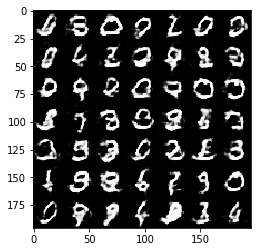

Epoch 1/2... Discriminator Loss: 1.2920... Generator Loss: 0.8675
Epoch 1/2... Discriminator Loss: 1.2176... Generator Loss: 1.0507
Epoch 1/2... Discriminator Loss: 1.1406... Generator Loss: 1.1653
Epoch 1/2... Discriminator Loss: 1.1478... Generator Loss: 0.9756
Epoch 1/2... Discriminator Loss: 1.4453... Generator Loss: 0.7192
Epoch 1/2... Discriminator Loss: 1.4312... Generator Loss: 0.5648
Epoch 1/2... Discriminator Loss: 1.2957... Generator Loss: 1.2502
Epoch 1/2... Discriminator Loss: 1.1958... Generator Loss: 0.8842
Epoch 1/2... Discriminator Loss: 1.2114... Generator Loss: 0.5275
Epoch 1/2... Discriminator Loss: 1.2708... Generator Loss: 0.8377
Epoch 1/2... Discriminator Loss: 1.2997... Generator Loss: 0.6585
Epoch 1/2... Discriminator Loss: 1.1518... Generator Loss: 1.1457


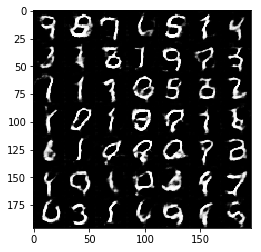

Epoch 1/2... Discriminator Loss: 1.4057... Generator Loss: 0.6827
Epoch 1/2... Discriminator Loss: 1.1977... Generator Loss: 0.8901
Epoch 1/2... Discriminator Loss: 1.1133... Generator Loss: 1.0713
Epoch 1/2... Discriminator Loss: 1.3722... Generator Loss: 0.9499
Epoch 1/2... Discriminator Loss: 1.2024... Generator Loss: 1.2163
Epoch 1/2... Discriminator Loss: 1.5130... Generator Loss: 0.7209
Epoch 1/2... Discriminator Loss: 1.2980... Generator Loss: 0.7171
Epoch 1/2... Discriminator Loss: 1.2978... Generator Loss: 1.1112
Epoch 1/2... Discriminator Loss: 1.5253... Generator Loss: 0.8687
Epoch 1/2... Discriminator Loss: 1.1470... Generator Loss: 0.4710
Epoch 1/2... Discriminator Loss: 1.5303... Generator Loss: 0.5574
Epoch 1/2... Discriminator Loss: 1.4456... Generator Loss: 0.9278


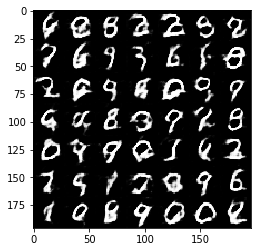

Epoch 1/2... Discriminator Loss: 1.2195... Generator Loss: 0.9544
Epoch 1/2... Discriminator Loss: 1.4293... Generator Loss: 0.6307
Epoch 1/2... Discriminator Loss: 1.2833... Generator Loss: 0.4923
Epoch 1/2... Discriminator Loss: 1.4161... Generator Loss: 0.4546
Epoch 1/2... Discriminator Loss: 1.4692... Generator Loss: 0.5586
Epoch 1/2... Discriminator Loss: 1.2239... Generator Loss: 0.7431
Epoch 1/2... Discriminator Loss: 1.4888... Generator Loss: 0.7689
Epoch 1/2... Discriminator Loss: 1.1678... Generator Loss: 0.9802
Epoch 1/2... Discriminator Loss: 1.2321... Generator Loss: 0.5975
Epoch 1/2... Discriminator Loss: 1.3993... Generator Loss: 0.8747
Epoch 1/2... Discriminator Loss: 1.1369... Generator Loss: 0.6990
Epoch 1/2... Discriminator Loss: 1.9003... Generator Loss: 0.8525


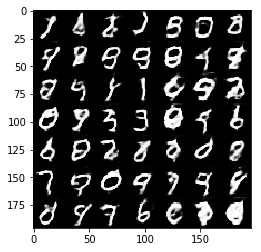

Epoch 1/2... Discriminator Loss: 1.0674... Generator Loss: 0.9363
Epoch 1/2... Discriminator Loss: 1.1340... Generator Loss: 1.1999
Epoch 1/2... Discriminator Loss: 1.5448... Generator Loss: 0.7825
Epoch 1/2... Discriminator Loss: 1.3678... Generator Loss: 0.7200
Epoch 1/2... Discriminator Loss: 1.3806... Generator Loss: 0.6465
Epoch 1/2... Discriminator Loss: 1.1391... Generator Loss: 0.9561
Epoch 1/2... Discriminator Loss: 1.6623... Generator Loss: 0.7438
Epoch 1/2... Discriminator Loss: 1.4373... Generator Loss: 0.8982
Epoch 1/2... Discriminator Loss: 1.3095... Generator Loss: 0.8680
Epoch 1/2... Discriminator Loss: 1.1238... Generator Loss: 0.9847
Epoch 1/2... Discriminator Loss: 1.5369... Generator Loss: 0.7938
Epoch 1/2... Discriminator Loss: 1.4335... Generator Loss: 0.4592


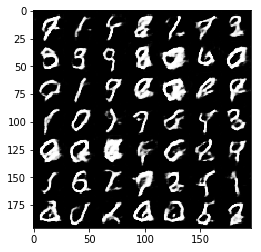

Epoch 1/2... Discriminator Loss: 1.2177... Generator Loss: 0.8298
Epoch 1/2... Discriminator Loss: 1.0856... Generator Loss: 1.0343
Epoch 1/2... Discriminator Loss: 1.2711... Generator Loss: 0.9599
Epoch 1/2... Discriminator Loss: 1.3336... Generator Loss: 0.6887
Epoch 1/2... Discriminator Loss: 1.3465... Generator Loss: 0.7784
Epoch 1/2... Discriminator Loss: 1.3560... Generator Loss: 0.8890
Epoch 1/2... Discriminator Loss: 1.2121... Generator Loss: 0.6353
Epoch 1/2... Discriminator Loss: 1.5102... Generator Loss: 0.8495
Epoch 1/2... Discriminator Loss: 1.4530... Generator Loss: 0.6100
Epoch 1/2... Discriminator Loss: 1.1278... Generator Loss: 1.0234
Epoch 1/2... Discriminator Loss: 1.7201... Generator Loss: 0.5352
Epoch 1/2... Discriminator Loss: 1.3342... Generator Loss: 0.8638


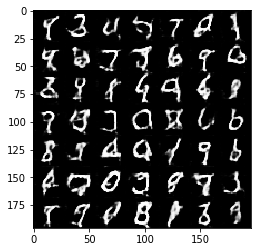

Epoch 1/2... Discriminator Loss: 1.7725... Generator Loss: 0.6679
Epoch 1/2... Discriminator Loss: 1.2149... Generator Loss: 1.0313
Epoch 1/2... Discriminator Loss: 1.2073... Generator Loss: 0.7568
Epoch 1/2... Discriminator Loss: 1.2866... Generator Loss: 0.6078
Epoch 1/2... Discriminator Loss: 1.2838... Generator Loss: 0.8565
Epoch 1/2... Discriminator Loss: 1.0176... Generator Loss: 0.7569
Epoch 1/2... Discriminator Loss: 1.2894... Generator Loss: 1.0227
Epoch 1/2... Discriminator Loss: 1.1141... Generator Loss: 0.7525
Epoch 1/2... Discriminator Loss: 1.2105... Generator Loss: 1.2004
Epoch 1/2... Discriminator Loss: 1.2012... Generator Loss: 1.1264
Epoch 1/2... Discriminator Loss: 1.3674... Generator Loss: 1.0025
Epoch 1/2... Discriminator Loss: 1.2148... Generator Loss: 0.6277


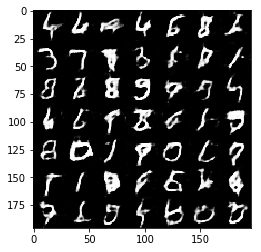

Epoch 1/2... Discriminator Loss: 0.9809... Generator Loss: 0.9067
Epoch 1/2... Discriminator Loss: 1.1385... Generator Loss: 0.6443
Epoch 1/2... Discriminator Loss: 1.2605... Generator Loss: 0.8688
Epoch 1/2... Discriminator Loss: 1.4185... Generator Loss: 0.8081
Epoch 1/2... Discriminator Loss: 1.3319... Generator Loss: 0.6902
Epoch 1/2... Discriminator Loss: 1.2314... Generator Loss: 0.8328
Epoch 1/2... Discriminator Loss: 1.2902... Generator Loss: 0.7187
Epoch 1/2... Discriminator Loss: 1.4090... Generator Loss: 0.5245
Epoch 1/2... Discriminator Loss: 1.3659... Generator Loss: 0.8557
Epoch 1/2... Discriminator Loss: 1.1098... Generator Loss: 0.6970
Epoch 1/2... Discriminator Loss: 1.5759... Generator Loss: 0.5756
Epoch 1/2... Discriminator Loss: 1.3443... Generator Loss: 0.8485


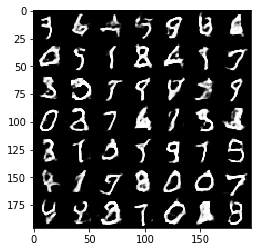

Epoch 1/2... Discriminator Loss: 1.4241... Generator Loss: 0.8495
Epoch 1/2... Discriminator Loss: 1.3656... Generator Loss: 0.8076
Epoch 1/2... Discriminator Loss: 1.3471... Generator Loss: 0.5974
Epoch 1/2... Discriminator Loss: 1.3815... Generator Loss: 0.5531
Epoch 1/2... Discriminator Loss: 1.4487... Generator Loss: 1.1318
Epoch 1/2... Discriminator Loss: 1.5657... Generator Loss: 0.4534
Epoch 1/2... Discriminator Loss: 1.2080... Generator Loss: 0.9308
Epoch 1/2... Discriminator Loss: 1.0354... Generator Loss: 0.8944
Epoch 1/2... Discriminator Loss: 1.3994... Generator Loss: 0.7569
Epoch 1/2... Discriminator Loss: 1.4406... Generator Loss: 0.8555
Epoch 1/2... Discriminator Loss: 1.4464... Generator Loss: 0.7941
Epoch 1/2... Discriminator Loss: 1.2165... Generator Loss: 0.8448


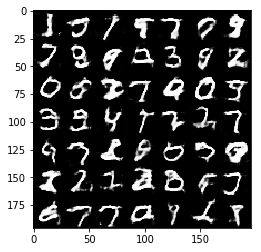

Epoch 1/2... Discriminator Loss: 1.1785... Generator Loss: 0.9087
Epoch 1/2... Discriminator Loss: 1.2076... Generator Loss: 0.8737
Epoch 1/2... Discriminator Loss: 1.0527... Generator Loss: 0.6076
Epoch 1/2... Discriminator Loss: 1.2179... Generator Loss: 0.8877
Epoch 1/2... Discriminator Loss: 1.3042... Generator Loss: 0.6418
Epoch 1/2... Discriminator Loss: 1.4643... Generator Loss: 1.0384
Epoch 1/2... Discriminator Loss: 1.4855... Generator Loss: 0.9704
Epoch 1/2... Discriminator Loss: 1.3732... Generator Loss: 0.8001
Epoch 1/2... Discriminator Loss: 1.3120... Generator Loss: 0.8183
Epoch 1/2... Discriminator Loss: 1.5036... Generator Loss: 0.8655
Epoch 1/2... Discriminator Loss: 1.6077... Generator Loss: 0.7599
Epoch 1/2... Discriminator Loss: 1.3339... Generator Loss: 0.8944


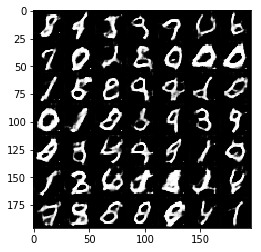

Epoch 1/2... Discriminator Loss: 1.3998... Generator Loss: 0.5939
Epoch 1/2... Discriminator Loss: 1.4624... Generator Loss: 0.8800
Epoch 1/2... Discriminator Loss: 1.3318... Generator Loss: 0.7703
Epoch 1/2... Discriminator Loss: 1.3161... Generator Loss: 0.8752
Epoch 1/2... Discriminator Loss: 1.2600... Generator Loss: 0.9436
Epoch 1/2... Discriminator Loss: 1.3454... Generator Loss: 0.7337
Epoch 1/2... Discriminator Loss: 1.2371... Generator Loss: 0.9816
Epoch 1/2... Discriminator Loss: 1.0776... Generator Loss: 1.0772
Epoch 1/2... Discriminator Loss: 1.3124... Generator Loss: 0.7099
Epoch 1/2... Discriminator Loss: 1.5401... Generator Loss: 0.7136
Epoch 1/2... Discriminator Loss: 1.2676... Generator Loss: 0.8455
Epoch 1/2... Discriminator Loss: 1.0838... Generator Loss: 0.8677


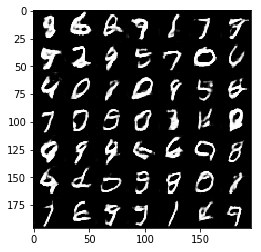

Epoch 1/2... Discriminator Loss: 1.1944... Generator Loss: 0.6173
Epoch 1/2... Discriminator Loss: 1.1701... Generator Loss: 0.7526
Epoch 1/2... Discriminator Loss: 1.1692... Generator Loss: 0.8329
Epoch 1/2... Discriminator Loss: 1.4623... Generator Loss: 0.5690
Epoch 1/2... Discriminator Loss: 1.4513... Generator Loss: 0.7145
Epoch 1/2... Discriminator Loss: 1.4298... Generator Loss: 0.7274
Epoch 1/2... Discriminator Loss: 1.2757... Generator Loss: 0.6807
Epoch 1/2... Discriminator Loss: 1.0153... Generator Loss: 0.8972
Epoch 1/2... Discriminator Loss: 1.1264... Generator Loss: 0.9625
Epoch 1/2... Discriminator Loss: 1.3485... Generator Loss: 0.6187
Epoch 1/2... Discriminator Loss: 1.2840... Generator Loss: 0.8595
Epoch 1/2... Discriminator Loss: 1.2023... Generator Loss: 0.8333


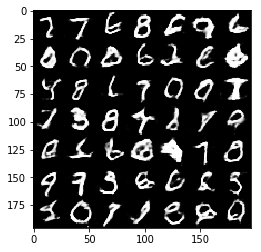

Epoch 1/2... Discriminator Loss: 1.0847... Generator Loss: 0.9047
Epoch 1/2... Discriminator Loss: 1.5103... Generator Loss: 0.5718
Epoch 1/2... Discriminator Loss: 1.1598... Generator Loss: 0.9381
Epoch 1/2... Discriminator Loss: 1.2179... Generator Loss: 1.0089
Epoch 1/2... Discriminator Loss: 1.6916... Generator Loss: 0.7455
Epoch 1/2... Discriminator Loss: 1.3432... Generator Loss: 1.2231
Epoch 1/2... Discriminator Loss: 1.4058... Generator Loss: 0.7307
Epoch 1/2... Discriminator Loss: 1.2335... Generator Loss: 0.6758
Epoch 1/2... Discriminator Loss: 0.9568... Generator Loss: 1.5361
Epoch 1/2... Discriminator Loss: 1.4157... Generator Loss: 1.1317
Epoch 1/2... Discriminator Loss: 1.5042... Generator Loss: 0.6122
Epoch 1/2... Discriminator Loss: 1.2423... Generator Loss: 0.5856


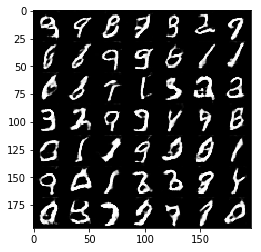

Epoch 1/2... Discriminator Loss: 1.3307... Generator Loss: 0.9290
Epoch 1/2... Discriminator Loss: 1.2858... Generator Loss: 0.3728
Epoch 1/2... Discriminator Loss: 1.2226... Generator Loss: 0.5822
Epoch 1/2... Discriminator Loss: 1.2496... Generator Loss: 0.5626
Epoch 1/2... Discriminator Loss: 1.3826... Generator Loss: 0.5177
Epoch 1/2... Discriminator Loss: 1.1720... Generator Loss: 0.6637
Epoch 1/2... Discriminator Loss: 1.2340... Generator Loss: 0.7529
Epoch 1/2... Discriminator Loss: 1.0969... Generator Loss: 0.7788
Epoch 1/2... Discriminator Loss: 1.3646... Generator Loss: 0.6348
Epoch 1/2... Discriminator Loss: 1.1890... Generator Loss: 0.7611
Epoch 1/2... Discriminator Loss: 1.4044... Generator Loss: 0.7786
Epoch 1/2... Discriminator Loss: 1.4319... Generator Loss: 0.5659


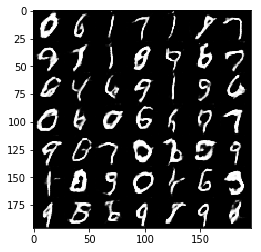

Epoch 1/2... Discriminator Loss: 1.1617... Generator Loss: 1.0528
Epoch 1/2... Discriminator Loss: 1.1395... Generator Loss: 0.8918
Epoch 1/2... Discriminator Loss: 1.3536... Generator Loss: 0.7514
Epoch 1/2... Discriminator Loss: 1.0601... Generator Loss: 1.1312
Epoch 1/2... Discriminator Loss: 1.2312... Generator Loss: 1.1774
Epoch 1/2... Discriminator Loss: 1.1452... Generator Loss: 0.7696
Epoch 1/2... Discriminator Loss: 1.0661... Generator Loss: 0.7645
Epoch 1/2... Discriminator Loss: 1.3900... Generator Loss: 0.6512
Epoch 1/2... Discriminator Loss: 1.1264... Generator Loss: 0.7799
Epoch 1/2... Discriminator Loss: 1.4753... Generator Loss: 0.9083
Epoch 1/2... Discriminator Loss: 1.2130... Generator Loss: 0.5172
Epoch 1/2... Discriminator Loss: 1.1204... Generator Loss: 0.8723


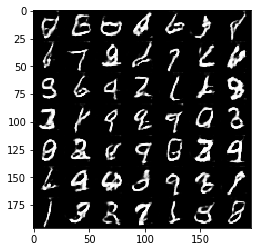

Epoch 1/2... Discriminator Loss: 1.2704... Generator Loss: 0.6051
Epoch 1/2... Discriminator Loss: 1.6260... Generator Loss: 0.5047
Epoch 1/2... Discriminator Loss: 1.3101... Generator Loss: 0.5746
Epoch 1/2... Discriminator Loss: 1.3891... Generator Loss: 0.9368
Epoch 1/2... Discriminator Loss: 1.2440... Generator Loss: 0.6761
Epoch 1/2... Discriminator Loss: 1.2050... Generator Loss: 1.5056
Epoch 1/2... Discriminator Loss: 1.2606... Generator Loss: 0.7038
Epoch 1/2... Discriminator Loss: 1.0208... Generator Loss: 0.8373
Epoch 1/2... Discriminator Loss: 1.1545... Generator Loss: 0.9139
Epoch 1/2... Discriminator Loss: 1.2222... Generator Loss: 0.8681
Epoch 1/2... Discriminator Loss: 1.4385... Generator Loss: 0.7649
Epoch 1/2... Discriminator Loss: 1.9748... Generator Loss: 0.3248


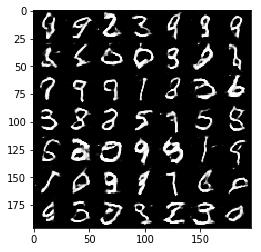

Epoch 1/2... Discriminator Loss: 1.0607... Generator Loss: 0.8440
Epoch 1/2... Discriminator Loss: 1.1336... Generator Loss: 1.2913
Epoch 1/2... Discriminator Loss: 1.2215... Generator Loss: 0.6357
Epoch 1/2... Discriminator Loss: 1.2246... Generator Loss: 0.9390
Epoch 1/2... Discriminator Loss: 1.0963... Generator Loss: 0.9044
Epoch 1/2... Discriminator Loss: 1.4419... Generator Loss: 0.5425
Epoch 1/2... Discriminator Loss: 1.2596... Generator Loss: 0.8253
Epoch 1/2... Discriminator Loss: 1.3265... Generator Loss: 1.1154
Epoch 1/2... Discriminator Loss: 0.9020... Generator Loss: 1.0343
Epoch 1/2... Discriminator Loss: 1.1741... Generator Loss: 0.9710
Epoch 1/2... Discriminator Loss: 1.0933... Generator Loss: 0.9149
Epoch 1/2... Discriminator Loss: 1.3451... Generator Loss: 0.7001


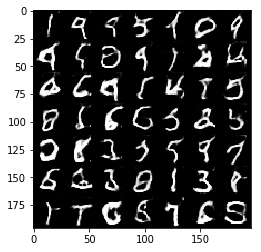

Epoch 1/2... Discriminator Loss: 0.9243... Generator Loss: 1.2496
Epoch 1/2... Discriminator Loss: 1.2108... Generator Loss: 0.9362
Epoch 1/2... Discriminator Loss: 1.5381... Generator Loss: 0.7525
Epoch 1/2... Discriminator Loss: 1.2476... Generator Loss: 0.7226
Epoch 1/2... Discriminator Loss: 1.3908... Generator Loss: 0.6767
Epoch 1/2... Discriminator Loss: 1.3578... Generator Loss: 1.1219
Epoch 1/2... Discriminator Loss: 1.0352... Generator Loss: 0.9659
Epoch 1/2... Discriminator Loss: 1.3049... Generator Loss: 0.6725
Epoch 1/2... Discriminator Loss: 0.9911... Generator Loss: 1.0325
Epoch 1/2... Discriminator Loss: 1.0667... Generator Loss: 0.9891
Epoch 1/2... Discriminator Loss: 1.1040... Generator Loss: 0.4904
Epoch 1/2... Discriminator Loss: 1.4862... Generator Loss: 0.8426


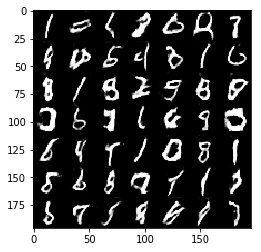

Epoch 1/2... Discriminator Loss: 1.1031... Generator Loss: 1.3148
Epoch 1/2... Discriminator Loss: 1.2876... Generator Loss: 0.8682
Epoch 1/2... Discriminator Loss: 1.3039... Generator Loss: 0.7472
Epoch 1/2... Discriminator Loss: 0.9369... Generator Loss: 0.6682
Epoch 1/2... Discriminator Loss: 1.1407... Generator Loss: 0.7330
Epoch 1/2... Discriminator Loss: 1.3301... Generator Loss: 1.0491
Epoch 1/2... Discriminator Loss: 1.3089... Generator Loss: 0.7275
Epoch 1/2... Discriminator Loss: 1.0708... Generator Loss: 1.2134
Epoch 1/2... Discriminator Loss: 1.0450... Generator Loss: 0.7232
Epoch 1/2... Discriminator Loss: 1.2468... Generator Loss: 0.8919
Epoch 1/2... Discriminator Loss: 1.2572... Generator Loss: 0.8907
Epoch 1/2... Discriminator Loss: 1.1171... Generator Loss: 1.2221


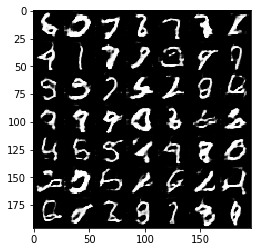

Epoch 1/2... Discriminator Loss: 1.3588... Generator Loss: 0.5172
Epoch 1/2... Discriminator Loss: 1.2080... Generator Loss: 1.1419
Epoch 1/2... Discriminator Loss: 1.4307... Generator Loss: 1.4794
Epoch 1/2... Discriminator Loss: 1.1089... Generator Loss: 1.3197
Epoch 1/2... Discriminator Loss: 1.1910... Generator Loss: 0.7663
Epoch 1/2... Discriminator Loss: 1.2334... Generator Loss: 0.7337
Epoch 1/2... Discriminator Loss: 1.3183... Generator Loss: 0.5514
Epoch 1/2... Discriminator Loss: 0.9993... Generator Loss: 0.5003
Epoch 1/2... Discriminator Loss: 1.2997... Generator Loss: 0.9033
Epoch 1/2... Discriminator Loss: 1.0370... Generator Loss: 0.4833
Epoch 1/2... Discriminator Loss: 1.1630... Generator Loss: 0.5974
Epoch 1/2... Discriminator Loss: 1.1144... Generator Loss: 0.7565


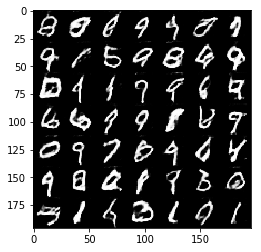

Epoch 1/2... Discriminator Loss: 1.1228... Generator Loss: 0.5734
Epoch 1/2... Discriminator Loss: 1.2111... Generator Loss: 1.0748
Epoch 1/2... Discriminator Loss: 1.4128... Generator Loss: 0.4794
Epoch 1/2... Discriminator Loss: 1.4689... Generator Loss: 0.6173
Epoch 1/2... Discriminator Loss: 1.1432... Generator Loss: 1.1938
Epoch 1/2... Discriminator Loss: 1.4541... Generator Loss: 0.7689
Epoch 1/2... Discriminator Loss: 1.2286... Generator Loss: 0.6833
Epoch 1/2... Discriminator Loss: 1.0823... Generator Loss: 0.8765
Epoch 1/2... Discriminator Loss: 1.4928... Generator Loss: 0.9560
Epoch 1/2... Discriminator Loss: 1.1336... Generator Loss: 0.7569
Epoch 1/2... Discriminator Loss: 1.4800... Generator Loss: 0.4038
Epoch 1/2... Discriminator Loss: 1.3299... Generator Loss: 1.1691


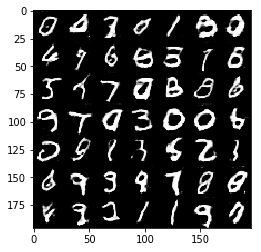

Epoch 1/2... Discriminator Loss: 1.4157... Generator Loss: 1.4372
Epoch 1/2... Discriminator Loss: 1.0615... Generator Loss: 0.8543
Epoch 1/2... Discriminator Loss: 1.0414... Generator Loss: 1.1135
Epoch 1/2... Discriminator Loss: 1.1821... Generator Loss: 1.0398
Epoch 1/2... Discriminator Loss: 1.0610... Generator Loss: 1.4021
Epoch 1/2... Discriminator Loss: 1.1059... Generator Loss: 0.7452
Epoch 1/2... Discriminator Loss: 1.2479... Generator Loss: 0.6800
Epoch 1/2... Discriminator Loss: 1.3381... Generator Loss: 0.9893
Epoch 1/2... Discriminator Loss: 1.2355... Generator Loss: 1.1039
Epoch 1/2... Discriminator Loss: 1.0609... Generator Loss: 0.9936
Epoch 1/2... Discriminator Loss: 1.1279... Generator Loss: 0.6126
Epoch 1/2... Discriminator Loss: 1.3297... Generator Loss: 0.6285


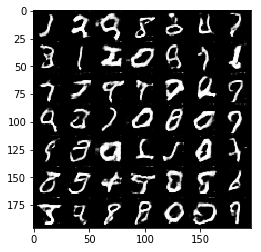

Epoch 1/2... Discriminator Loss: 1.1714... Generator Loss: 1.0684
Epoch 1/2... Discriminator Loss: 1.3846... Generator Loss: 0.9308
Epoch 1/2... Discriminator Loss: 1.2248... Generator Loss: 1.6411
Epoch 2/2... Discriminator Loss: 1.2960... Generator Loss: 0.5594
Epoch 2/2... Discriminator Loss: 1.1003... Generator Loss: 0.8774
Epoch 2/2... Discriminator Loss: 1.1920... Generator Loss: 0.5694
Epoch 2/2... Discriminator Loss: 1.3210... Generator Loss: 0.9025
Epoch 2/2... Discriminator Loss: 1.3031... Generator Loss: 0.6399
Epoch 2/2... Discriminator Loss: 0.9627... Generator Loss: 1.2868
Epoch 2/2... Discriminator Loss: 1.2465... Generator Loss: 0.8665
Epoch 2/2... Discriminator Loss: 1.0368... Generator Loss: 1.0696
Epoch 2/2... Discriminator Loss: 1.1885... Generator Loss: 0.8073


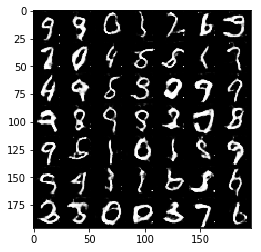

Epoch 2/2... Discriminator Loss: 0.9674... Generator Loss: 1.1798
Epoch 2/2... Discriminator Loss: 0.8510... Generator Loss: 1.3184
Epoch 2/2... Discriminator Loss: 1.0678... Generator Loss: 1.1417
Epoch 2/2... Discriminator Loss: 1.7548... Generator Loss: 1.2492
Epoch 2/2... Discriminator Loss: 1.4368... Generator Loss: 0.5907
Epoch 2/2... Discriminator Loss: 1.2720... Generator Loss: 0.5256
Epoch 2/2... Discriminator Loss: 1.2852... Generator Loss: 1.2840
Epoch 2/2... Discriminator Loss: 1.2030... Generator Loss: 1.2919
Epoch 2/2... Discriminator Loss: 1.1898... Generator Loss: 0.9845
Epoch 2/2... Discriminator Loss: 1.1757... Generator Loss: 1.1233
Epoch 2/2... Discriminator Loss: 1.2491... Generator Loss: 0.6554
Epoch 2/2... Discriminator Loss: 1.2175... Generator Loss: 0.6523


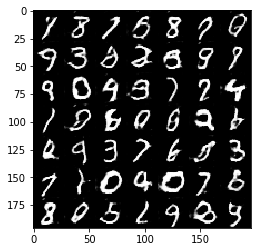

Epoch 2/2... Discriminator Loss: 1.2817... Generator Loss: 0.8859
Epoch 2/2... Discriminator Loss: 0.9639... Generator Loss: 1.1886
Epoch 2/2... Discriminator Loss: 1.3756... Generator Loss: 0.8949
Epoch 2/2... Discriminator Loss: 1.0804... Generator Loss: 0.7125
Epoch 2/2... Discriminator Loss: 1.0314... Generator Loss: 0.6108
Epoch 2/2... Discriminator Loss: 0.7740... Generator Loss: 1.0337
Epoch 2/2... Discriminator Loss: 1.3557... Generator Loss: 0.7824
Epoch 2/2... Discriminator Loss: 1.0880... Generator Loss: 0.7355
Epoch 2/2... Discriminator Loss: 1.2209... Generator Loss: 0.9065
Epoch 2/2... Discriminator Loss: 1.0481... Generator Loss: 1.2229
Epoch 2/2... Discriminator Loss: 0.9926... Generator Loss: 0.8955
Epoch 2/2... Discriminator Loss: 1.5052... Generator Loss: 0.4779


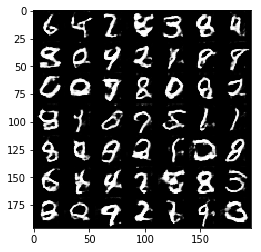

Epoch 2/2... Discriminator Loss: 1.2535... Generator Loss: 0.9437
Epoch 2/2... Discriminator Loss: 1.0573... Generator Loss: 0.8321
Epoch 2/2... Discriminator Loss: 1.1588... Generator Loss: 0.9288
Epoch 2/2... Discriminator Loss: 1.1966... Generator Loss: 0.5042
Epoch 2/2... Discriminator Loss: 1.2501... Generator Loss: 1.1718
Epoch 2/2... Discriminator Loss: 0.9391... Generator Loss: 1.0010
Epoch 2/2... Discriminator Loss: 1.1576... Generator Loss: 0.7621
Epoch 2/2... Discriminator Loss: 1.4886... Generator Loss: 2.1888
Epoch 2/2... Discriminator Loss: 1.4503... Generator Loss: 0.3586
Epoch 2/2... Discriminator Loss: 1.0099... Generator Loss: 1.3694
Epoch 2/2... Discriminator Loss: 1.1174... Generator Loss: 0.9508
Epoch 2/2... Discriminator Loss: 1.0707... Generator Loss: 0.8261


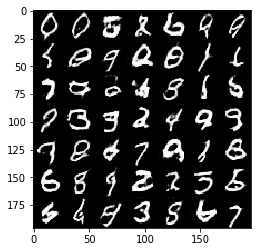

Epoch 2/2... Discriminator Loss: 1.0560... Generator Loss: 1.0750
Epoch 2/2... Discriminator Loss: 1.2959... Generator Loss: 1.6161
Epoch 2/2... Discriminator Loss: 1.3089... Generator Loss: 0.7672
Epoch 2/2... Discriminator Loss: 1.6266... Generator Loss: 0.5933
Epoch 2/2... Discriminator Loss: 1.0657... Generator Loss: 1.0959
Epoch 2/2... Discriminator Loss: 1.2565... Generator Loss: 1.2793
Epoch 2/2... Discriminator Loss: 1.1176... Generator Loss: 1.1446
Epoch 2/2... Discriminator Loss: 1.4270... Generator Loss: 0.3288
Epoch 2/2... Discriminator Loss: 0.8045... Generator Loss: 0.9937
Epoch 2/2... Discriminator Loss: 1.3735... Generator Loss: 0.8388
Epoch 2/2... Discriminator Loss: 0.9772... Generator Loss: 0.4813
Epoch 2/2... Discriminator Loss: 0.9965... Generator Loss: 1.0418


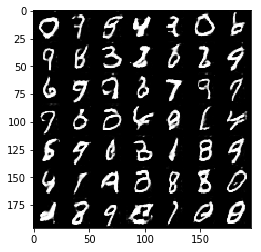

Epoch 2/2... Discriminator Loss: 1.0992... Generator Loss: 1.0913
Epoch 2/2... Discriminator Loss: 1.2915... Generator Loss: 0.9394
Epoch 2/2... Discriminator Loss: 1.0799... Generator Loss: 0.8927
Epoch 2/2... Discriminator Loss: 0.8314... Generator Loss: 1.2639
Epoch 2/2... Discriminator Loss: 0.8305... Generator Loss: 1.2030
Epoch 2/2... Discriminator Loss: 1.5647... Generator Loss: 0.2618
Epoch 2/2... Discriminator Loss: 1.2917... Generator Loss: 0.5539
Epoch 2/2... Discriminator Loss: 1.2766... Generator Loss: 1.0607
Epoch 2/2... Discriminator Loss: 1.2879... Generator Loss: 0.6440
Epoch 2/2... Discriminator Loss: 0.9426... Generator Loss: 1.1588
Epoch 2/2... Discriminator Loss: 1.1580... Generator Loss: 0.9600
Epoch 2/2... Discriminator Loss: 1.2806... Generator Loss: 0.5008


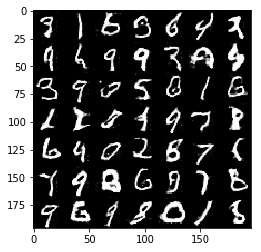

Epoch 2/2... Discriminator Loss: 0.9933... Generator Loss: 1.0578
Epoch 2/2... Discriminator Loss: 1.1420... Generator Loss: 0.7037
Epoch 2/2... Discriminator Loss: 0.9234... Generator Loss: 1.2652
Epoch 2/2... Discriminator Loss: 1.0794... Generator Loss: 0.8482
Epoch 2/2... Discriminator Loss: 1.1558... Generator Loss: 1.9192
Epoch 2/2... Discriminator Loss: 1.1116... Generator Loss: 1.0076
Epoch 2/2... Discriminator Loss: 1.1414... Generator Loss: 0.6574
Epoch 2/2... Discriminator Loss: 1.2051... Generator Loss: 0.8151
Epoch 2/2... Discriminator Loss: 1.2946... Generator Loss: 1.5433
Epoch 2/2... Discriminator Loss: 1.1948... Generator Loss: 1.0033
Epoch 2/2... Discriminator Loss: 0.9656... Generator Loss: 0.4034
Epoch 2/2... Discriminator Loss: 1.0445... Generator Loss: 0.8717


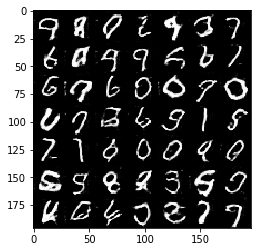

Epoch 2/2... Discriminator Loss: 1.1868... Generator Loss: 0.6701
Epoch 2/2... Discriminator Loss: 1.2035... Generator Loss: 0.9003
Epoch 2/2... Discriminator Loss: 1.2566... Generator Loss: 0.8982
Epoch 2/2... Discriminator Loss: 0.9253... Generator Loss: 1.0031
Epoch 2/2... Discriminator Loss: 1.0433... Generator Loss: 0.7605
Epoch 2/2... Discriminator Loss: 0.9915... Generator Loss: 1.1262
Epoch 2/2... Discriminator Loss: 1.2307... Generator Loss: 1.4388
Epoch 2/2... Discriminator Loss: 0.8362... Generator Loss: 1.4108
Epoch 2/2... Discriminator Loss: 1.2944... Generator Loss: 0.4393
Epoch 2/2... Discriminator Loss: 1.3465... Generator Loss: 0.3251
Epoch 2/2... Discriminator Loss: 1.1355... Generator Loss: 0.9256
Epoch 2/2... Discriminator Loss: 0.8456... Generator Loss: 0.9561


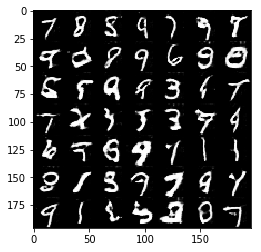

Epoch 2/2... Discriminator Loss: 1.0637... Generator Loss: 0.6611
Epoch 2/2... Discriminator Loss: 1.4141... Generator Loss: 0.7364
Epoch 2/2... Discriminator Loss: 1.2496... Generator Loss: 1.2172
Epoch 2/2... Discriminator Loss: 1.0093... Generator Loss: 1.4877
Epoch 2/2... Discriminator Loss: 1.5609... Generator Loss: 2.2671
Epoch 2/2... Discriminator Loss: 0.7494... Generator Loss: 1.2100
Epoch 2/2... Discriminator Loss: 1.1756... Generator Loss: 1.2707
Epoch 2/2... Discriminator Loss: 1.5466... Generator Loss: 1.3455
Epoch 2/2... Discriminator Loss: 0.6901... Generator Loss: 0.9871
Epoch 2/2... Discriminator Loss: 1.4501... Generator Loss: 0.6261
Epoch 2/2... Discriminator Loss: 1.0427... Generator Loss: 1.1634
Epoch 2/2... Discriminator Loss: 1.3157... Generator Loss: 0.8010


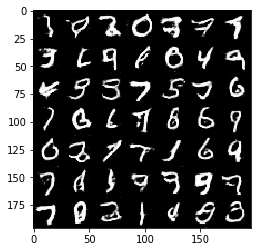

Epoch 2/2... Discriminator Loss: 1.2579... Generator Loss: 0.9897
Epoch 2/2... Discriminator Loss: 1.1033... Generator Loss: 0.7544
Epoch 2/2... Discriminator Loss: 1.2057... Generator Loss: 0.9548
Epoch 2/2... Discriminator Loss: 0.8795... Generator Loss: 1.2193
Epoch 2/2... Discriminator Loss: 1.3081... Generator Loss: 0.4932
Epoch 2/2... Discriminator Loss: 1.0336... Generator Loss: 1.3902
Epoch 2/2... Discriminator Loss: 0.9800... Generator Loss: 1.1875
Epoch 2/2... Discriminator Loss: 1.0214... Generator Loss: 1.2840
Epoch 2/2... Discriminator Loss: 1.5083... Generator Loss: 0.3100
Epoch 2/2... Discriminator Loss: 1.0271... Generator Loss: 1.4389
Epoch 2/2... Discriminator Loss: 0.8775... Generator Loss: 1.1396
Epoch 2/2... Discriminator Loss: 1.2649... Generator Loss: 1.5319


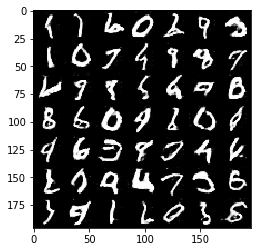

Epoch 2/2... Discriminator Loss: 1.2210... Generator Loss: 1.2231
Epoch 2/2... Discriminator Loss: 1.3427... Generator Loss: 1.8616
Epoch 2/2... Discriminator Loss: 1.1785... Generator Loss: 0.4187
Epoch 2/2... Discriminator Loss: 0.8793... Generator Loss: 1.0288
Epoch 2/2... Discriminator Loss: 0.8194... Generator Loss: 0.6486
Epoch 2/2... Discriminator Loss: 0.9706... Generator Loss: 1.3367
Epoch 2/2... Discriminator Loss: 0.8873... Generator Loss: 1.2504
Epoch 2/2... Discriminator Loss: 0.8554... Generator Loss: 1.7791
Epoch 2/2... Discriminator Loss: 1.2041... Generator Loss: 0.9607
Epoch 2/2... Discriminator Loss: 0.8737... Generator Loss: 1.6089
Epoch 2/2... Discriminator Loss: 1.4155... Generator Loss: 0.2800
Epoch 2/2... Discriminator Loss: 1.0619... Generator Loss: 1.4403


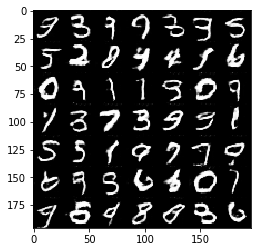

Epoch 2/2... Discriminator Loss: 0.8276... Generator Loss: 1.6789
Epoch 2/2... Discriminator Loss: 1.5121... Generator Loss: 0.3333
Epoch 2/2... Discriminator Loss: 1.3769... Generator Loss: 0.8135
Epoch 2/2... Discriminator Loss: 1.2540... Generator Loss: 0.9073
Epoch 2/2... Discriminator Loss: 1.2026... Generator Loss: 0.7600
Epoch 2/2... Discriminator Loss: 0.9692... Generator Loss: 1.5174
Epoch 2/2... Discriminator Loss: 1.4519... Generator Loss: 1.3944
Epoch 2/2... Discriminator Loss: 1.7332... Generator Loss: 2.4442
Epoch 2/2... Discriminator Loss: 0.8388... Generator Loss: 1.6333
Epoch 2/2... Discriminator Loss: 1.3846... Generator Loss: 1.1643
Epoch 2/2... Discriminator Loss: 0.8078... Generator Loss: 1.6835
Epoch 2/2... Discriminator Loss: 1.0873... Generator Loss: 0.8505


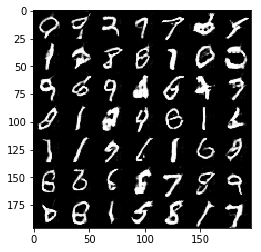

Epoch 2/2... Discriminator Loss: 1.0297... Generator Loss: 1.2774
Epoch 2/2... Discriminator Loss: 1.0261... Generator Loss: 1.7422
Epoch 2/2... Discriminator Loss: 1.0480... Generator Loss: 0.5261
Epoch 2/2... Discriminator Loss: 0.8905... Generator Loss: 1.1015
Epoch 2/2... Discriminator Loss: 0.8284... Generator Loss: 1.2067
Epoch 2/2... Discriminator Loss: 1.2732... Generator Loss: 0.8032
Epoch 2/2... Discriminator Loss: 1.3482... Generator Loss: 0.3859
Epoch 2/2... Discriminator Loss: 0.9654... Generator Loss: 1.5198
Epoch 2/2... Discriminator Loss: 1.4619... Generator Loss: 0.7118
Epoch 2/2... Discriminator Loss: 0.7593... Generator Loss: 1.4884
Epoch 2/2... Discriminator Loss: 1.4492... Generator Loss: 0.8350
Epoch 2/2... Discriminator Loss: 1.0593... Generator Loss: 0.7464


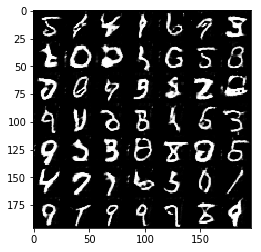

Epoch 2/2... Discriminator Loss: 0.7431... Generator Loss: 0.8939
Epoch 2/2... Discriminator Loss: 0.9624... Generator Loss: 1.5293
Epoch 2/2... Discriminator Loss: 1.1715... Generator Loss: 0.7597
Epoch 2/2... Discriminator Loss: 1.2022... Generator Loss: 0.8006
Epoch 2/2... Discriminator Loss: 1.2897... Generator Loss: 0.7066
Epoch 2/2... Discriminator Loss: 1.3350... Generator Loss: 0.7182
Epoch 2/2... Discriminator Loss: 1.2409... Generator Loss: 2.1679
Epoch 2/2... Discriminator Loss: 1.2686... Generator Loss: 0.7596
Epoch 2/2... Discriminator Loss: 1.2604... Generator Loss: 0.7026
Epoch 2/2... Discriminator Loss: 0.7697... Generator Loss: 1.4383
Epoch 2/2... Discriminator Loss: 0.8316... Generator Loss: 1.3036
Epoch 2/2... Discriminator Loss: 1.5395... Generator Loss: 0.3617


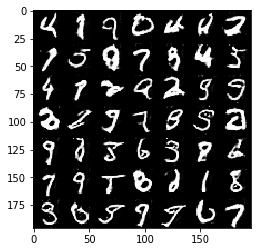

Epoch 2/2... Discriminator Loss: 0.9178... Generator Loss: 1.2788
Epoch 2/2... Discriminator Loss: 1.3496... Generator Loss: 1.2179
Epoch 2/2... Discriminator Loss: 1.1921... Generator Loss: 1.2971
Epoch 2/2... Discriminator Loss: 0.8235... Generator Loss: 2.0830
Epoch 2/2... Discriminator Loss: 0.8012... Generator Loss: 1.2605
Epoch 2/2... Discriminator Loss: 0.7042... Generator Loss: 1.4128
Epoch 2/2... Discriminator Loss: 1.1214... Generator Loss: 1.9155
Epoch 2/2... Discriminator Loss: 1.2369... Generator Loss: 0.8236
Epoch 2/2... Discriminator Loss: 0.9227... Generator Loss: 1.3296
Epoch 2/2... Discriminator Loss: 0.7672... Generator Loss: 1.4233
Epoch 2/2... Discriminator Loss: 1.2125... Generator Loss: 0.6305
Epoch 2/2... Discriminator Loss: 0.9822... Generator Loss: 1.1430


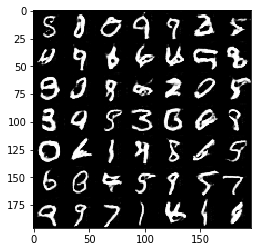

Epoch 2/2... Discriminator Loss: 0.7561... Generator Loss: 1.2436
Epoch 2/2... Discriminator Loss: 0.9559... Generator Loss: 0.9753
Epoch 2/2... Discriminator Loss: 0.7851... Generator Loss: 1.2759
Epoch 2/2... Discriminator Loss: 1.2631... Generator Loss: 0.9293
Epoch 2/2... Discriminator Loss: 0.8465... Generator Loss: 1.5696
Epoch 2/2... Discriminator Loss: 0.9895... Generator Loss: 1.8027
Epoch 2/2... Discriminator Loss: 0.9465... Generator Loss: 1.0572
Epoch 2/2... Discriminator Loss: 1.2530... Generator Loss: 0.9599
Epoch 2/2... Discriminator Loss: 0.8065... Generator Loss: 1.1472
Epoch 2/2... Discriminator Loss: 0.8297... Generator Loss: 1.2607
Epoch 2/2... Discriminator Loss: 0.9488... Generator Loss: 0.5720
Epoch 2/2... Discriminator Loss: 1.7220... Generator Loss: 0.6253


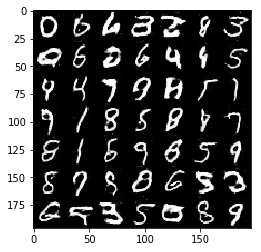

Epoch 2/2... Discriminator Loss: 0.8024... Generator Loss: 0.8554
Epoch 2/2... Discriminator Loss: 0.7943... Generator Loss: 2.2519
Epoch 2/2... Discriminator Loss: 1.6135... Generator Loss: 1.1925
Epoch 2/2... Discriminator Loss: 0.8424... Generator Loss: 0.4517
Epoch 2/2... Discriminator Loss: 1.4347... Generator Loss: 2.1396
Epoch 2/2... Discriminator Loss: 1.2020... Generator Loss: 1.5479
Epoch 2/2... Discriminator Loss: 1.3946... Generator Loss: 0.3273
Epoch 2/2... Discriminator Loss: 0.9305... Generator Loss: 1.1329
Epoch 2/2... Discriminator Loss: 1.1479... Generator Loss: 1.3207
Epoch 2/2... Discriminator Loss: 1.0366... Generator Loss: 1.2553
Epoch 2/2... Discriminator Loss: 0.6189... Generator Loss: 1.8832
Epoch 2/2... Discriminator Loss: 0.9062... Generator Loss: 1.5086


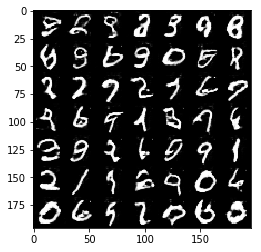

Epoch 2/2... Discriminator Loss: 1.3272... Generator Loss: 0.5038
Epoch 2/2... Discriminator Loss: 0.9344... Generator Loss: 1.0229
Epoch 2/2... Discriminator Loss: 1.2175... Generator Loss: 0.8633
Epoch 2/2... Discriminator Loss: 0.8474... Generator Loss: 0.9141
Epoch 2/2... Discriminator Loss: 1.2015... Generator Loss: 1.3529
Epoch 2/2... Discriminator Loss: 0.9763... Generator Loss: 1.2308
Epoch 2/2... Discriminator Loss: 0.6897... Generator Loss: 1.4386
Epoch 2/2... Discriminator Loss: 1.3528... Generator Loss: 1.5388
Epoch 2/2... Discriminator Loss: 1.3222... Generator Loss: 1.6080
Epoch 2/2... Discriminator Loss: 0.6960... Generator Loss: 1.5030
Epoch 2/2... Discriminator Loss: 1.0425... Generator Loss: 2.5405
Epoch 2/2... Discriminator Loss: 0.5874... Generator Loss: 1.4504


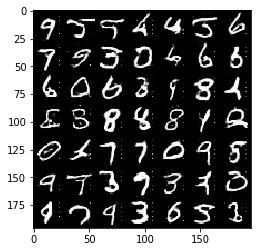

Epoch 2/2... Discriminator Loss: 0.9983... Generator Loss: 1.0354
Epoch 2/2... Discriminator Loss: 1.0210... Generator Loss: 1.3588
Epoch 2/2... Discriminator Loss: 1.3096... Generator Loss: 0.4538
Epoch 2/2... Discriminator Loss: 1.2452... Generator Loss: 0.8766
Epoch 2/2... Discriminator Loss: 1.4615... Generator Loss: 2.2008
Epoch 2/2... Discriminator Loss: 1.1936... Generator Loss: 1.1206
Epoch 2/2... Discriminator Loss: 0.7606... Generator Loss: 1.3873
Epoch 2/2... Discriminator Loss: 0.9672... Generator Loss: 0.9682
Epoch 2/2... Discriminator Loss: 1.0459... Generator Loss: 1.5934
Epoch 2/2... Discriminator Loss: 1.5813... Generator Loss: 1.4808
Epoch 2/2... Discriminator Loss: 0.9024... Generator Loss: 0.8315
Epoch 2/2... Discriminator Loss: 0.9639... Generator Loss: 0.7641


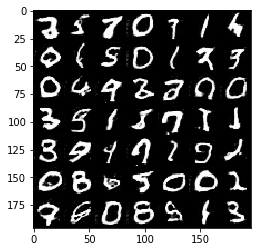

Epoch 2/2... Discriminator Loss: 1.1232... Generator Loss: 0.9775
Epoch 2/2... Discriminator Loss: 0.9364... Generator Loss: 1.2059
Epoch 2/2... Discriminator Loss: 0.8418... Generator Loss: 1.4905
Epoch 2/2... Discriminator Loss: 1.1854... Generator Loss: 1.4599
Epoch 2/2... Discriminator Loss: 1.3385... Generator Loss: 0.7918
Epoch 2/2... Discriminator Loss: 0.7820... Generator Loss: 0.7407
Epoch 2/2... Discriminator Loss: 1.4205... Generator Loss: 0.4640
Epoch 2/2... Discriminator Loss: 0.8894... Generator Loss: 0.9010
Epoch 2/2... Discriminator Loss: 1.2223... Generator Loss: 0.5116
Epoch 2/2... Discriminator Loss: 1.0671... Generator Loss: 0.7287
Epoch 2/2... Discriminator Loss: 0.9180... Generator Loss: 1.0913
Epoch 2/2... Discriminator Loss: 1.4267... Generator Loss: 0.6088


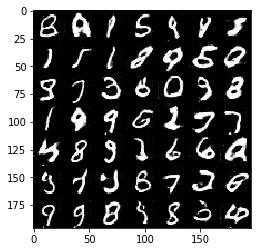

Epoch 2/2... Discriminator Loss: 0.6893... Generator Loss: 0.8114
Epoch 2/2... Discriminator Loss: 0.5937... Generator Loss: 0.5669
Epoch 2/2... Discriminator Loss: 0.7424... Generator Loss: 1.0087
Epoch 2/2... Discriminator Loss: 0.9437... Generator Loss: 1.1828
Epoch 2/2... Discriminator Loss: 1.1621... Generator Loss: 0.4347
Epoch 2/2... Discriminator Loss: 1.2778... Generator Loss: 0.4264
Epoch 2/2... Discriminator Loss: 1.1225... Generator Loss: 2.3338
Epoch 2/2... Discriminator Loss: 0.9804... Generator Loss: 1.4777
Epoch 2/2... Discriminator Loss: 1.2781... Generator Loss: 0.7321
Epoch 2/2... Discriminator Loss: 1.3035... Generator Loss: 1.5584
Epoch 2/2... Discriminator Loss: 0.9793... Generator Loss: 1.4317
Epoch 2/2... Discriminator Loss: 0.9213... Generator Loss: 1.3433


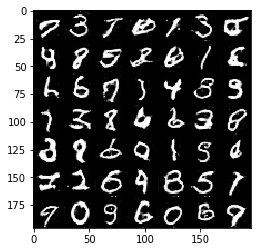

Epoch 2/2... Discriminator Loss: 0.9978... Generator Loss: 0.9513
Epoch 2/2... Discriminator Loss: 0.9865... Generator Loss: 1.4384
Epoch 2/2... Discriminator Loss: 1.1096... Generator Loss: 1.3659
Epoch 2/2... Discriminator Loss: 2.0841... Generator Loss: 0.2592
Epoch 2/2... Discriminator Loss: 1.0464... Generator Loss: 1.0982
Epoch 2/2... Discriminator Loss: 1.2010... Generator Loss: 0.9242
Epoch 2/2... Discriminator Loss: 1.1234... Generator Loss: 1.4903
Epoch 2/2... Discriminator Loss: 1.1882... Generator Loss: 0.9123
Epoch 2/2... Discriminator Loss: 0.7027... Generator Loss: 1.1084
Epoch 2/2... Discriminator Loss: 1.3249... Generator Loss: 0.3903
Epoch 2/2... Discriminator Loss: 1.7593... Generator Loss: 0.3687
Epoch 2/2... Discriminator Loss: 0.7909... Generator Loss: 1.5336


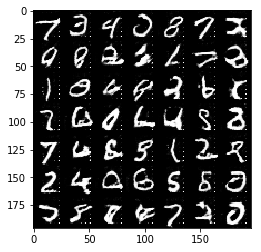

Epoch 2/2... Discriminator Loss: 0.8976... Generator Loss: 1.2469
Epoch 2/2... Discriminator Loss: 1.0059... Generator Loss: 0.4531
Epoch 2/2... Discriminator Loss: 0.7038... Generator Loss: 0.9949
Epoch 2/2... Discriminator Loss: 0.5695... Generator Loss: 1.3086
Epoch 2/2... Discriminator Loss: 1.5012... Generator Loss: 2.3183
Epoch 2/2... Discriminator Loss: 0.8458... Generator Loss: 1.1476
Epoch 2/2... Discriminator Loss: 0.9446... Generator Loss: 0.9010
Epoch 2/2... Discriminator Loss: 1.1393... Generator Loss: 1.7152
Epoch 2/2... Discriminator Loss: 1.5422... Generator Loss: 0.4744
Epoch 2/2... Discriminator Loss: 1.1018... Generator Loss: 1.3513
Epoch 2/2... Discriminator Loss: 0.8546... Generator Loss: 0.7948
Epoch 2/2... Discriminator Loss: 0.9895... Generator Loss: 1.6002


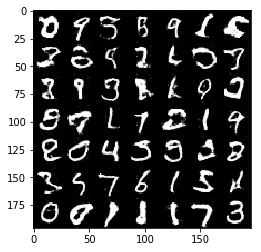

Epoch 2/2... Discriminator Loss: 0.9652... Generator Loss: 1.1561
Epoch 2/2... Discriminator Loss: 1.1114... Generator Loss: 0.6835
Epoch 2/2... Discriminator Loss: 0.8748... Generator Loss: 1.0309
Epoch 2/2... Discriminator Loss: 0.9695... Generator Loss: 0.7513
Epoch 2/2... Discriminator Loss: 0.8516... Generator Loss: 0.8568
Epoch 2/2... Discriminator Loss: 0.9257... Generator Loss: 0.8496
Epoch 2/2... Discriminator Loss: 0.7221... Generator Loss: 1.1798
Epoch 2/2... Discriminator Loss: 1.1559... Generator Loss: 1.1007
Epoch 2/2... Discriminator Loss: 0.9225... Generator Loss: 0.7219
Epoch 2/2... Discriminator Loss: 0.9606... Generator Loss: 1.0504
Epoch 2/2... Discriminator Loss: 1.0378... Generator Loss: 1.2190
Epoch 2/2... Discriminator Loss: 1.0635... Generator Loss: 1.1092


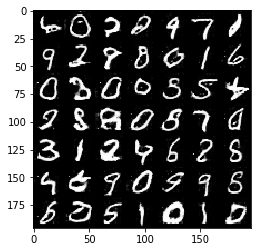

Epoch 2/2... Discriminator Loss: 1.2956... Generator Loss: 1.4554
Epoch 2/2... Discriminator Loss: 0.9366... Generator Loss: 1.1244
Epoch 2/2... Discriminator Loss: 1.1161... Generator Loss: 1.5942
Epoch 2/2... Discriminator Loss: 0.8311... Generator Loss: 1.0776
Epoch 2/2... Discriminator Loss: 0.5389... Generator Loss: 1.1429
Epoch 2/2... Discriminator Loss: 0.5869... Generator Loss: 1.8832
Epoch 2/2... Discriminator Loss: 0.8128... Generator Loss: 1.7033
Epoch 2/2... Discriminator Loss: 1.4586... Generator Loss: 0.4302
Epoch 2/2... Discriminator Loss: 1.1038... Generator Loss: 1.4713
Epoch 2/2... Discriminator Loss: 1.1464... Generator Loss: 1.0162
Epoch 2/2... Discriminator Loss: 0.9107... Generator Loss: 0.9265
Epoch 2/2... Discriminator Loss: 0.7569... Generator Loss: 0.9030


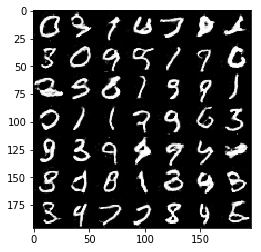

Epoch 2/2... Discriminator Loss: 1.7333... Generator Loss: 1.0492
Epoch 2/2... Discriminator Loss: 1.0959... Generator Loss: 0.8580
Epoch 2/2... Discriminator Loss: 1.1072... Generator Loss: 1.3936
Epoch 2/2... Discriminator Loss: 1.3913... Generator Loss: 1.0907
Epoch 2/2... Discriminator Loss: 0.8688... Generator Loss: 1.3598
Epoch 2/2... Discriminator Loss: 1.1734... Generator Loss: 1.2976
Epoch 2/2... Discriminator Loss: 0.9864... Generator Loss: 1.5745
Epoch 2/2... Discriminator Loss: 0.9897... Generator Loss: 1.1062
Epoch 2/2... Discriminator Loss: 0.6924... Generator Loss: 0.8859
Epoch 2/2... Discriminator Loss: 0.7159... Generator Loss: 1.3195
Epoch 2/2... Discriminator Loss: 0.8299... Generator Loss: 1.7784
Epoch 2/2... Discriminator Loss: 0.7427... Generator Loss: 1.2499


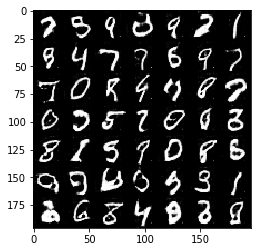

Epoch 2/2... Discriminator Loss: 0.9264... Generator Loss: 0.7733
Epoch 2/2... Discriminator Loss: 1.1467... Generator Loss: 0.6951
Epoch 2/2... Discriminator Loss: 0.8213... Generator Loss: 1.2174
Epoch 2/2... Discriminator Loss: 0.6788... Generator Loss: 1.4075
Epoch 2/2... Discriminator Loss: 1.3123... Generator Loss: 0.7123
Epoch 2/2... Discriminator Loss: 1.1286... Generator Loss: 1.2337
Epoch 2/2... Discriminator Loss: 0.7656... Generator Loss: 0.9392
Epoch 2/2... Discriminator Loss: 0.9558... Generator Loss: 0.9250
Epoch 2/2... Discriminator Loss: 0.9516... Generator Loss: 1.2888
Epoch 2/2... Discriminator Loss: 1.3110... Generator Loss: 0.5934
Epoch 2/2... Discriminator Loss: 0.7141... Generator Loss: 1.1087
Epoch 2/2... Discriminator Loss: 0.8280... Generator Loss: 1.0342


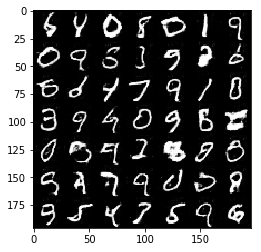

Epoch 2/2... Discriminator Loss: 1.6094... Generator Loss: 1.9463
Epoch 2/2... Discriminator Loss: 1.2741... Generator Loss: 0.5882
Epoch 2/2... Discriminator Loss: 0.7633... Generator Loss: 1.0054
Epoch 2/2... Discriminator Loss: 0.8721... Generator Loss: 1.9672
Epoch 2/2... Discriminator Loss: 0.8779... Generator Loss: 0.6608
Epoch 2/2... Discriminator Loss: 1.1688... Generator Loss: 1.0698
Epoch 2/2... Discriminator Loss: 0.9126... Generator Loss: 1.2155
Epoch 2/2... Discriminator Loss: 0.9367... Generator Loss: 0.9902
Epoch 2/2... Discriminator Loss: 1.0585... Generator Loss: 1.6066
Epoch 2/2... Discriminator Loss: 0.8996... Generator Loss: 1.9933
Epoch 2/2... Discriminator Loss: 0.7411... Generator Loss: 1.7662
Epoch 2/2... Discriminator Loss: 0.6051... Generator Loss: 1.6643


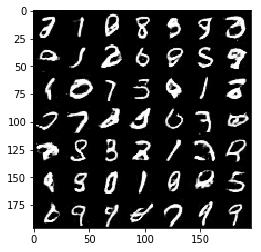

Epoch 2/2... Discriminator Loss: 1.0870... Generator Loss: 1.1972
Epoch 2/2... Discriminator Loss: 1.0882... Generator Loss: 0.7432
Epoch 2/2... Discriminator Loss: 1.0492... Generator Loss: 1.0468
Epoch 2/2... Discriminator Loss: 1.1546... Generator Loss: 0.9103
Epoch 2/2... Discriminator Loss: 0.8013... Generator Loss: 1.1136
Epoch 2/2... Discriminator Loss: 0.8769... Generator Loss: 0.8674
Epoch 2/2... Discriminator Loss: 1.3165... Generator Loss: 0.6852
Epoch 2/2... Discriminator Loss: 0.9305... Generator Loss: 0.9840
Epoch 2/2... Discriminator Loss: 1.2429... Generator Loss: 1.0831
Epoch 2/2... Discriminator Loss: 0.8037... Generator Loss: 1.0076
Epoch 2/2... Discriminator Loss: 0.6795... Generator Loss: 1.4490
Epoch 2/2... Discriminator Loss: 1.0945... Generator Loss: 0.9486


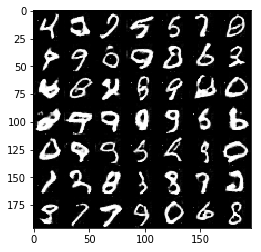

Epoch 2/2... Discriminator Loss: 0.8109... Generator Loss: 1.1550
Epoch 2/2... Discriminator Loss: 0.9508... Generator Loss: 0.7416
Epoch 2/2... Discriminator Loss: 0.9763... Generator Loss: 2.7713
Epoch 2/2... Discriminator Loss: 2.1145... Generator Loss: 0.8138
Epoch 2/2... Discriminator Loss: 0.5994... Generator Loss: 1.2384
Epoch 2/2... Discriminator Loss: 0.6592... Generator Loss: 0.6476
Epoch 2/2... Discriminator Loss: 0.9695... Generator Loss: 1.1309
Epoch 2/2... Discriminator Loss: 0.8862... Generator Loss: 0.6940
Epoch 2/2... Discriminator Loss: 0.8436... Generator Loss: 1.5155
Epoch 2/2... Discriminator Loss: 0.8742... Generator Loss: 0.7407
Epoch 2/2... Discriminator Loss: 1.0521... Generator Loss: 1.8805
Epoch 2/2... Discriminator Loss: 1.4418... Generator Loss: 0.6681


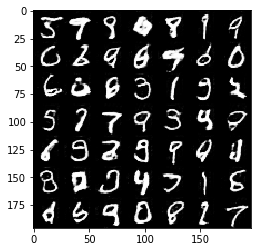

Epoch 2/2... Discriminator Loss: 0.8277... Generator Loss: 0.7843
Epoch 2/2... Discriminator Loss: 0.9483... Generator Loss: 0.9306
Epoch 2/2... Discriminator Loss: 1.2603... Generator Loss: 1.0852
Epoch 2/2... Discriminator Loss: 0.9860... Generator Loss: 2.3486
Epoch 2/2... Discriminator Loss: 0.7893... Generator Loss: 1.7246
Epoch 2/2... Discriminator Loss: 0.8374... Generator Loss: 1.5974
Epoch 2/2... Discriminator Loss: 0.8416... Generator Loss: 0.7520
Epoch 2/2... Discriminator Loss: 1.1947... Generator Loss: 0.6975
Epoch 2/2... Discriminator Loss: 1.1569... Generator Loss: 1.6598
Epoch 2/2... Discriminator Loss: 1.3746... Generator Loss: 2.3898
Epoch 2/2... Discriminator Loss: 1.0075... Generator Loss: 1.0817
Epoch 2/2... Discriminator Loss: 1.1166... Generator Loss: 1.2128


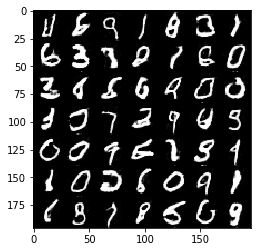

Epoch 2/2... Discriminator Loss: 0.6631... Generator Loss: 1.0332
Epoch 2/2... Discriminator Loss: 1.1836... Generator Loss: 1.0807
Epoch 2/2... Discriminator Loss: 1.3356... Generator Loss: 1.6831
Epoch 2/2... Discriminator Loss: 0.8254... Generator Loss: 1.5445
Epoch 2/2... Discriminator Loss: 1.3713... Generator Loss: 1.1057
Epoch 2/2... Discriminator Loss: 1.0294... Generator Loss: 1.8106
Final : Discriminator Loss: 1.0294... Generator Loss: 1.8106


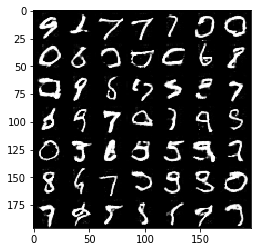

In [12]:
batch_size = 16
z_dim = 100
learning_rate = 0.0006
beta1 = 0.3


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1... Discriminator Loss: 1.9891... Generator Loss: 0.3097
Epoch 1/1... Discriminator Loss: 1.5948... Generator Loss: 1.0410
Epoch 1/1... Discriminator Loss: 3.1999... Generator Loss: 0.1507
Epoch 1/1... Discriminator Loss: 1.7652... Generator Loss: 0.8607
Epoch 1/1... Discriminator Loss: 0.9213... Generator Loss: 2.0646
Epoch 1/1... Discriminator Loss: 1.2384... Generator Loss: 2.5948
Epoch 1/1... Discriminator Loss: 1.2181... Generator Loss: 1.2987
Epoch 1/1... Discriminator Loss: 1.1959... Generator Loss: 1.6104
Epoch 1/1... Discriminator Loss: 0.7642... Generator Loss: 3.3288
Epoch 1/1... Discriminator Loss: 2.5488... Generator Loss: 6.6398
Epoch 1/1... Discriminator Loss: 1.1337... Generator Loss: 1.1532
Epoch 1/1... Discriminator Loss: 1.4436... Generator Loss: 0.6665


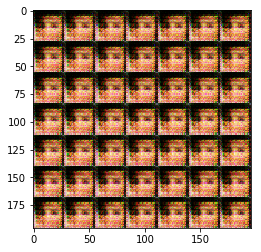

Epoch 1/1... Discriminator Loss: 0.7244... Generator Loss: 2.2573
Epoch 1/1... Discriminator Loss: 0.4683... Generator Loss: 3.6640
Epoch 1/1... Discriminator Loss: 0.3802... Generator Loss: 1.6313
Epoch 1/1... Discriminator Loss: 1.0685... Generator Loss: 1.0194
Epoch 1/1... Discriminator Loss: 0.6272... Generator Loss: 1.3878
Epoch 1/1... Discriminator Loss: 0.4899... Generator Loss: 2.2421
Epoch 1/1... Discriminator Loss: 1.0713... Generator Loss: 0.8881
Epoch 1/1... Discriminator Loss: 1.1983... Generator Loss: 3.6705
Epoch 1/1... Discriminator Loss: 0.3508... Generator Loss: 5.1155
Epoch 1/1... Discriminator Loss: 0.4356... Generator Loss: 2.4989
Epoch 1/1... Discriminator Loss: 0.2982... Generator Loss: 1.6545
Epoch 1/1... Discriminator Loss: 0.2141... Generator Loss: 3.8930


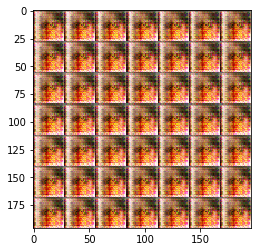

Epoch 1/1... Discriminator Loss: 0.9968... Generator Loss: 1.0344
Epoch 1/1... Discriminator Loss: 0.1890... Generator Loss: 2.6128
Epoch 1/1... Discriminator Loss: 0.2525... Generator Loss: 3.1965
Epoch 1/1... Discriminator Loss: 0.2148... Generator Loss: 2.4362
Epoch 1/1... Discriminator Loss: 0.8312... Generator Loss: 0.7873
Epoch 1/1... Discriminator Loss: 0.3778... Generator Loss: 2.3746
Epoch 1/1... Discriminator Loss: 0.6071... Generator Loss: 1.6074
Epoch 1/1... Discriminator Loss: 0.4910... Generator Loss: 2.4269
Epoch 1/1... Discriminator Loss: 0.1091... Generator Loss: 3.6879
Epoch 1/1... Discriminator Loss: 0.5646... Generator Loss: 1.5313
Epoch 1/1... Discriminator Loss: 0.1099... Generator Loss: 3.1418
Epoch 1/1... Discriminator Loss: 0.8238... Generator Loss: 1.8997


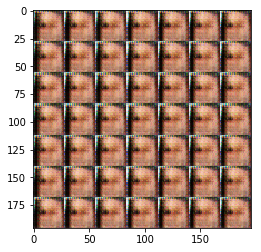

Epoch 1/1... Discriminator Loss: 0.4812... Generator Loss: 3.0642
Epoch 1/1... Discriminator Loss: 0.4946... Generator Loss: 2.6229
Epoch 1/1... Discriminator Loss: 0.2867... Generator Loss: 2.6786
Epoch 1/1... Discriminator Loss: 0.2914... Generator Loss: 2.4940
Epoch 1/1... Discriminator Loss: 0.4585... Generator Loss: 2.4929
Epoch 1/1... Discriminator Loss: 0.4404... Generator Loss: 1.7620
Epoch 1/1... Discriminator Loss: 0.2848... Generator Loss: 2.5903
Epoch 1/1... Discriminator Loss: 0.2951... Generator Loss: 2.4440
Epoch 1/1... Discriminator Loss: 0.2766... Generator Loss: 2.4627
Epoch 1/1... Discriminator Loss: 0.9574... Generator Loss: 2.0249
Epoch 1/1... Discriminator Loss: 0.2724... Generator Loss: 2.8110
Epoch 1/1... Discriminator Loss: 1.7697... Generator Loss: 0.6053


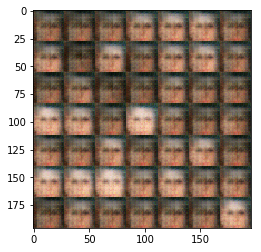

Epoch 1/1... Discriminator Loss: 0.8313... Generator Loss: 2.0227
Epoch 1/1... Discriminator Loss: 1.4896... Generator Loss: 1.3524
Epoch 1/1... Discriminator Loss: 1.2478... Generator Loss: 0.3798
Epoch 1/1... Discriminator Loss: 1.2063... Generator Loss: 2.3279
Epoch 1/1... Discriminator Loss: 1.1467... Generator Loss: 0.8470
Epoch 1/1... Discriminator Loss: 1.0334... Generator Loss: 1.0420
Epoch 1/1... Discriminator Loss: 1.1310... Generator Loss: 1.0571
Epoch 1/1... Discriminator Loss: 1.7074... Generator Loss: 0.4592
Epoch 1/1... Discriminator Loss: 1.3959... Generator Loss: 2.3407
Epoch 1/1... Discriminator Loss: 0.8905... Generator Loss: 1.0257
Epoch 1/1... Discriminator Loss: 1.0118... Generator Loss: 1.3672
Epoch 1/1... Discriminator Loss: 1.0790... Generator Loss: 0.8609


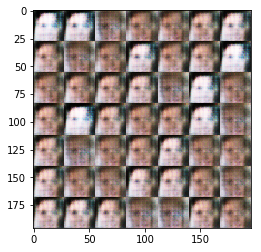

Epoch 1/1... Discriminator Loss: 1.0792... Generator Loss: 0.9731
Epoch 1/1... Discriminator Loss: 1.1315... Generator Loss: 0.8558
Epoch 1/1... Discriminator Loss: 1.1004... Generator Loss: 0.8446
Epoch 1/1... Discriminator Loss: 1.1997... Generator Loss: 1.6371
Epoch 1/1... Discriminator Loss: 0.5909... Generator Loss: 1.3008
Epoch 1/1... Discriminator Loss: 0.7078... Generator Loss: 1.6063
Epoch 1/1... Discriminator Loss: 1.4392... Generator Loss: 0.7387
Epoch 1/1... Discriminator Loss: 1.1465... Generator Loss: 0.8427
Epoch 1/1... Discriminator Loss: 1.0781... Generator Loss: 1.6590
Epoch 1/1... Discriminator Loss: 0.9024... Generator Loss: 1.3802
Epoch 1/1... Discriminator Loss: 1.2773... Generator Loss: 0.7369
Epoch 1/1... Discriminator Loss: 1.6334... Generator Loss: 0.5110


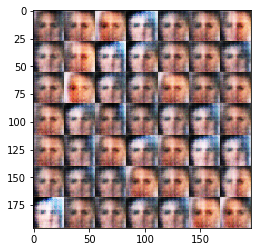

Epoch 1/1... Discriminator Loss: 1.7898... Generator Loss: 0.4608
Epoch 1/1... Discriminator Loss: 0.7433... Generator Loss: 1.8159
Epoch 1/1... Discriminator Loss: 1.5580... Generator Loss: 0.7913
Epoch 1/1... Discriminator Loss: 1.0303... Generator Loss: 1.2183
Epoch 1/1... Discriminator Loss: 0.8139... Generator Loss: 1.3243
Epoch 1/1... Discriminator Loss: 1.7080... Generator Loss: 2.0969
Epoch 1/1... Discriminator Loss: 1.0760... Generator Loss: 2.1155
Epoch 1/1... Discriminator Loss: 0.8511... Generator Loss: 1.3530
Epoch 1/1... Discriminator Loss: 1.1813... Generator Loss: 0.7133
Epoch 1/1... Discriminator Loss: 0.8559... Generator Loss: 1.0009
Epoch 1/1... Discriminator Loss: 1.0292... Generator Loss: 1.7743
Epoch 1/1... Discriminator Loss: 1.4245... Generator Loss: 1.0723


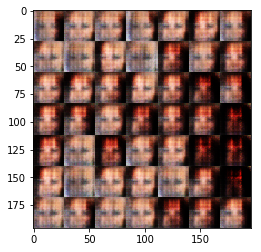

Epoch 1/1... Discriminator Loss: 1.1745... Generator Loss: 0.9801
Epoch 1/1... Discriminator Loss: 0.7454... Generator Loss: 1.1738
Epoch 1/1... Discriminator Loss: 1.1111... Generator Loss: 1.3887
Epoch 1/1... Discriminator Loss: 1.1605... Generator Loss: 1.1474
Epoch 1/1... Discriminator Loss: 1.1267... Generator Loss: 0.6464
Epoch 1/1... Discriminator Loss: 1.3939... Generator Loss: 1.8139
Epoch 1/1... Discriminator Loss: 1.1258... Generator Loss: 1.1119
Epoch 1/1... Discriminator Loss: 1.7275... Generator Loss: 1.6891
Epoch 1/1... Discriminator Loss: 1.2808... Generator Loss: 0.9425
Epoch 1/1... Discriminator Loss: 0.9814... Generator Loss: 1.4128
Epoch 1/1... Discriminator Loss: 1.0728... Generator Loss: 0.6767
Epoch 1/1... Discriminator Loss: 1.1702... Generator Loss: 1.0277


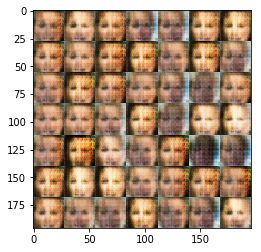

Epoch 1/1... Discriminator Loss: 1.2100... Generator Loss: 1.1203
Epoch 1/1... Discriminator Loss: 1.1949... Generator Loss: 1.4750
Epoch 1/1... Discriminator Loss: 1.6161... Generator Loss: 0.7846
Epoch 1/1... Discriminator Loss: 0.8647... Generator Loss: 1.2944
Epoch 1/1... Discriminator Loss: 0.8734... Generator Loss: 0.8652
Epoch 1/1... Discriminator Loss: 1.1303... Generator Loss: 0.7492
Epoch 1/1... Discriminator Loss: 1.2712... Generator Loss: 1.4018
Epoch 1/1... Discriminator Loss: 0.9906... Generator Loss: 1.0470
Epoch 1/1... Discriminator Loss: 0.8440... Generator Loss: 0.8528
Epoch 1/1... Discriminator Loss: 1.5083... Generator Loss: 1.0394
Epoch 1/1... Discriminator Loss: 1.1703... Generator Loss: 1.0632
Epoch 1/1... Discriminator Loss: 0.8297... Generator Loss: 1.6418


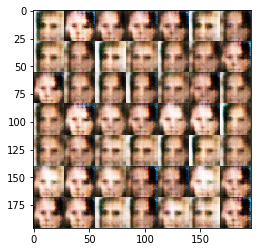

Epoch 1/1... Discriminator Loss: 1.1963... Generator Loss: 1.2993
Epoch 1/1... Discriminator Loss: 1.0698... Generator Loss: 1.1218
Epoch 1/1... Discriminator Loss: 1.4410... Generator Loss: 0.5755
Epoch 1/1... Discriminator Loss: 0.9344... Generator Loss: 1.0274
Epoch 1/1... Discriminator Loss: 1.1452... Generator Loss: 0.5951
Epoch 1/1... Discriminator Loss: 1.0296... Generator Loss: 1.0755
Epoch 1/1... Discriminator Loss: 0.9106... Generator Loss: 1.5840
Epoch 1/1... Discriminator Loss: 1.3415... Generator Loss: 0.6717
Epoch 1/1... Discriminator Loss: 1.0550... Generator Loss: 1.5977
Epoch 1/1... Discriminator Loss: 0.9099... Generator Loss: 0.9652
Epoch 1/1... Discriminator Loss: 1.2073... Generator Loss: 1.0643
Epoch 1/1... Discriminator Loss: 1.0749... Generator Loss: 1.2279


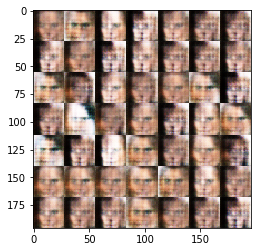

Epoch 1/1... Discriminator Loss: 0.9237... Generator Loss: 1.2317
Epoch 1/1... Discriminator Loss: 1.0086... Generator Loss: 1.2368
Epoch 1/1... Discriminator Loss: 1.4766... Generator Loss: 0.5370
Epoch 1/1... Discriminator Loss: 1.2513... Generator Loss: 1.2674
Epoch 1/1... Discriminator Loss: 0.9656... Generator Loss: 1.2604
Epoch 1/1... Discriminator Loss: 1.0171... Generator Loss: 0.9863
Epoch 1/1... Discriminator Loss: 1.3317... Generator Loss: 0.5770
Epoch 1/1... Discriminator Loss: 1.2163... Generator Loss: 1.1695
Epoch 1/1... Discriminator Loss: 1.4799... Generator Loss: 0.9138
Epoch 1/1... Discriminator Loss: 1.6628... Generator Loss: 0.7128
Epoch 1/1... Discriminator Loss: 1.0749... Generator Loss: 1.3794
Epoch 1/1... Discriminator Loss: 1.3679... Generator Loss: 0.7496


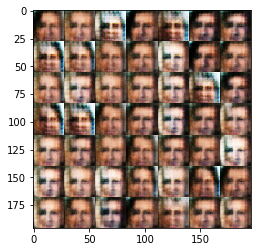

Epoch 1/1... Discriminator Loss: 1.1158... Generator Loss: 1.3261
Epoch 1/1... Discriminator Loss: 1.1895... Generator Loss: 0.8858
Epoch 1/1... Discriminator Loss: 1.0318... Generator Loss: 1.1123
Epoch 1/1... Discriminator Loss: 1.3904... Generator Loss: 0.7643
Epoch 1/1... Discriminator Loss: 1.3863... Generator Loss: 1.2652
Epoch 1/1... Discriminator Loss: 0.8447... Generator Loss: 1.4134
Epoch 1/1... Discriminator Loss: 1.3804... Generator Loss: 0.9721
Epoch 1/1... Discriminator Loss: 0.9655... Generator Loss: 1.0828
Epoch 1/1... Discriminator Loss: 0.7776... Generator Loss: 1.3364
Epoch 1/1... Discriminator Loss: 0.9193... Generator Loss: 1.1668
Epoch 1/1... Discriminator Loss: 0.9890... Generator Loss: 0.7174
Epoch 1/1... Discriminator Loss: 1.1936... Generator Loss: 0.6988


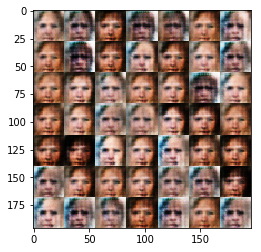

Epoch 1/1... Discriminator Loss: 1.0260... Generator Loss: 0.9508
Epoch 1/1... Discriminator Loss: 1.3204... Generator Loss: 1.0987
Epoch 1/1... Discriminator Loss: 1.4260... Generator Loss: 0.6244
Epoch 1/1... Discriminator Loss: 1.0322... Generator Loss: 1.0196
Epoch 1/1... Discriminator Loss: 0.9470... Generator Loss: 0.9813
Epoch 1/1... Discriminator Loss: 1.0470... Generator Loss: 0.8707
Epoch 1/1... Discriminator Loss: 1.1409... Generator Loss: 0.6960
Epoch 1/1... Discriminator Loss: 1.1934... Generator Loss: 1.0072
Epoch 1/1... Discriminator Loss: 1.3419... Generator Loss: 0.8593
Epoch 1/1... Discriminator Loss: 1.2745... Generator Loss: 1.1648
Epoch 1/1... Discriminator Loss: 1.1841... Generator Loss: 0.6299
Epoch 1/1... Discriminator Loss: 0.9857... Generator Loss: 1.0660


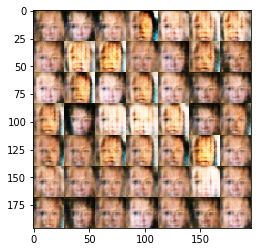

Epoch 1/1... Discriminator Loss: 0.9338... Generator Loss: 1.6032
Epoch 1/1... Discriminator Loss: 0.7094... Generator Loss: 1.5873
Epoch 1/1... Discriminator Loss: 1.3510... Generator Loss: 0.6907
Epoch 1/1... Discriminator Loss: 0.9782... Generator Loss: 1.2548
Epoch 1/1... Discriminator Loss: 1.3089... Generator Loss: 1.0811
Epoch 1/1... Discriminator Loss: 1.2080... Generator Loss: 0.7000
Epoch 1/1... Discriminator Loss: 1.0929... Generator Loss: 1.3946
Epoch 1/1... Discriminator Loss: 1.1567... Generator Loss: 0.7870
Epoch 1/1... Discriminator Loss: 1.4159... Generator Loss: 0.6912
Epoch 1/1... Discriminator Loss: 1.3618... Generator Loss: 0.6962
Epoch 1/1... Discriminator Loss: 1.3571... Generator Loss: 0.6212
Epoch 1/1... Discriminator Loss: 1.1595... Generator Loss: 1.1025


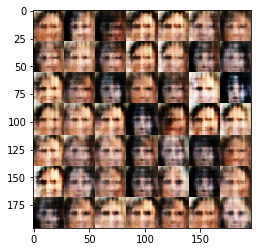

Epoch 1/1... Discriminator Loss: 1.3747... Generator Loss: 1.1302
Epoch 1/1... Discriminator Loss: 1.0937... Generator Loss: 0.6792
Epoch 1/1... Discriminator Loss: 1.3413... Generator Loss: 0.7226
Epoch 1/1... Discriminator Loss: 1.2721... Generator Loss: 0.8082
Epoch 1/1... Discriminator Loss: 1.1666... Generator Loss: 0.9791
Epoch 1/1... Discriminator Loss: 1.0531... Generator Loss: 1.3563
Epoch 1/1... Discriminator Loss: 0.8548... Generator Loss: 1.3019
Epoch 1/1... Discriminator Loss: 0.9082... Generator Loss: 1.3462
Epoch 1/1... Discriminator Loss: 0.8817... Generator Loss: 1.4640
Epoch 1/1... Discriminator Loss: 1.5275... Generator Loss: 0.8919
Epoch 1/1... Discriminator Loss: 1.2299... Generator Loss: 0.8109
Epoch 1/1... Discriminator Loss: 1.1633... Generator Loss: 1.0126


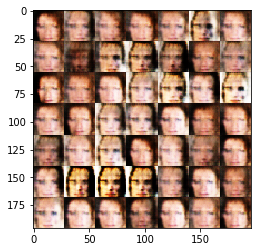

Epoch 1/1... Discriminator Loss: 0.7738... Generator Loss: 1.2683
Epoch 1/1... Discriminator Loss: 1.1294... Generator Loss: 0.8424
Epoch 1/1... Discriminator Loss: 0.9594... Generator Loss: 1.3716
Epoch 1/1... Discriminator Loss: 1.2024... Generator Loss: 0.7901
Epoch 1/1... Discriminator Loss: 1.1789... Generator Loss: 0.9506
Epoch 1/1... Discriminator Loss: 1.4036... Generator Loss: 0.7539
Epoch 1/1... Discriminator Loss: 1.2763... Generator Loss: 1.2226
Epoch 1/1... Discriminator Loss: 1.2054... Generator Loss: 1.1370
Epoch 1/1... Discriminator Loss: 1.2447... Generator Loss: 2.0324
Epoch 1/1... Discriminator Loss: 0.8166... Generator Loss: 1.3104
Epoch 1/1... Discriminator Loss: 0.9993... Generator Loss: 1.0505
Epoch 1/1... Discriminator Loss: 0.8982... Generator Loss: 0.9315


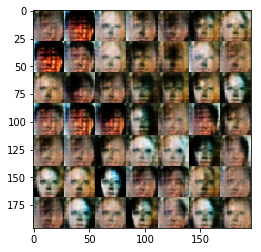

Epoch 1/1... Discriminator Loss: 1.2622... Generator Loss: 0.9497
Epoch 1/1... Discriminator Loss: 1.2757... Generator Loss: 0.6768
Epoch 1/1... Discriminator Loss: 1.0529... Generator Loss: 1.6877
Epoch 1/1... Discriminator Loss: 0.8249... Generator Loss: 1.0275
Epoch 1/1... Discriminator Loss: 1.8223... Generator Loss: 1.0682
Epoch 1/1... Discriminator Loss: 1.2456... Generator Loss: 1.1641
Epoch 1/1... Discriminator Loss: 1.2195... Generator Loss: 0.6760
Epoch 1/1... Discriminator Loss: 1.3402... Generator Loss: 1.0346
Epoch 1/1... Discriminator Loss: 1.1075... Generator Loss: 1.2235
Epoch 1/1... Discriminator Loss: 1.2736... Generator Loss: 0.8462
Epoch 1/1... Discriminator Loss: 0.9102... Generator Loss: 1.3527
Epoch 1/1... Discriminator Loss: 1.1369... Generator Loss: 1.0894


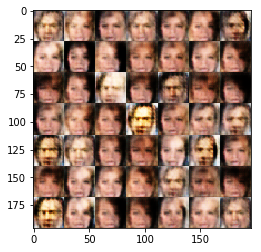

Epoch 1/1... Discriminator Loss: 0.9747... Generator Loss: 0.8085
Epoch 1/1... Discriminator Loss: 1.2266... Generator Loss: 1.2026
Epoch 1/1... Discriminator Loss: 1.3534... Generator Loss: 0.8185
Epoch 1/1... Discriminator Loss: 1.0755... Generator Loss: 1.1413
Epoch 1/1... Discriminator Loss: 1.7128... Generator Loss: 0.5379
Epoch 1/1... Discriminator Loss: 1.2988... Generator Loss: 0.8781
Epoch 1/1... Discriminator Loss: 1.5227... Generator Loss: 0.7786
Epoch 1/1... Discriminator Loss: 1.1699... Generator Loss: 1.3924
Epoch 1/1... Discriminator Loss: 1.3152... Generator Loss: 1.4805
Epoch 1/1... Discriminator Loss: 1.3076... Generator Loss: 1.0777
Epoch 1/1... Discriminator Loss: 1.1752... Generator Loss: 0.7194
Epoch 1/1... Discriminator Loss: 1.1620... Generator Loss: 1.2949


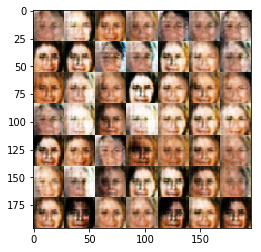

Epoch 1/1... Discriminator Loss: 1.1675... Generator Loss: 0.8613
Epoch 1/1... Discriminator Loss: 1.1600... Generator Loss: 1.2627
Epoch 1/1... Discriminator Loss: 1.2587... Generator Loss: 0.9035
Epoch 1/1... Discriminator Loss: 1.3366... Generator Loss: 0.9122
Epoch 1/1... Discriminator Loss: 1.2902... Generator Loss: 0.5946
Epoch 1/1... Discriminator Loss: 1.2238... Generator Loss: 0.8758
Epoch 1/1... Discriminator Loss: 1.5218... Generator Loss: 0.7847
Epoch 1/1... Discriminator Loss: 1.2021... Generator Loss: 1.3985
Epoch 1/1... Discriminator Loss: 1.3048... Generator Loss: 0.7981
Epoch 1/1... Discriminator Loss: 1.2991... Generator Loss: 0.8069
Epoch 1/1... Discriminator Loss: 1.1930... Generator Loss: 0.8663
Epoch 1/1... Discriminator Loss: 0.9960... Generator Loss: 0.8813


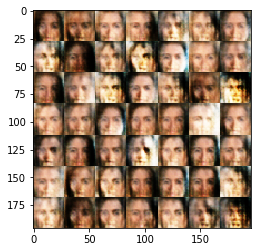

Epoch 1/1... Discriminator Loss: 1.0976... Generator Loss: 0.9202
Epoch 1/1... Discriminator Loss: 1.0935... Generator Loss: 0.8724
Epoch 1/1... Discriminator Loss: 1.3733... Generator Loss: 0.7856
Epoch 1/1... Discriminator Loss: 0.9876... Generator Loss: 1.2884
Epoch 1/1... Discriminator Loss: 1.2710... Generator Loss: 1.0049
Epoch 1/1... Discriminator Loss: 1.2132... Generator Loss: 0.9915
Epoch 1/1... Discriminator Loss: 1.2879... Generator Loss: 1.2461
Epoch 1/1... Discriminator Loss: 1.2127... Generator Loss: 0.7244
Epoch 1/1... Discriminator Loss: 1.3735... Generator Loss: 0.6280
Epoch 1/1... Discriminator Loss: 1.1839... Generator Loss: 1.0140
Epoch 1/1... Discriminator Loss: 1.3597... Generator Loss: 0.6922
Epoch 1/1... Discriminator Loss: 1.3776... Generator Loss: 0.6339


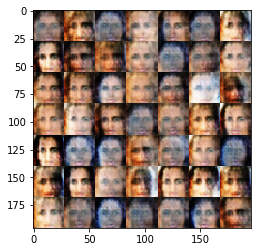

Epoch 1/1... Discriminator Loss: 1.0158... Generator Loss: 0.9282
Epoch 1/1... Discriminator Loss: 1.2666... Generator Loss: 0.5237
Epoch 1/1... Discriminator Loss: 1.0044... Generator Loss: 1.3743
Epoch 1/1... Discriminator Loss: 1.1554... Generator Loss: 0.7684
Epoch 1/1... Discriminator Loss: 0.9217... Generator Loss: 1.1518
Epoch 1/1... Discriminator Loss: 1.4891... Generator Loss: 0.5779
Epoch 1/1... Discriminator Loss: 1.2149... Generator Loss: 1.2895
Epoch 1/1... Discriminator Loss: 1.5236... Generator Loss: 0.8125
Epoch 1/1... Discriminator Loss: 1.2910... Generator Loss: 0.7759
Epoch 1/1... Discriminator Loss: 1.3330... Generator Loss: 0.8567
Epoch 1/1... Discriminator Loss: 1.0969... Generator Loss: 0.8682
Epoch 1/1... Discriminator Loss: 1.1676... Generator Loss: 0.9484


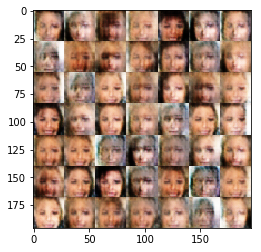

Epoch 1/1... Discriminator Loss: 1.0435... Generator Loss: 1.3426
Epoch 1/1... Discriminator Loss: 1.2145... Generator Loss: 0.8059
Epoch 1/1... Discriminator Loss: 1.1136... Generator Loss: 0.8051
Epoch 1/1... Discriminator Loss: 1.2353... Generator Loss: 0.9624
Epoch 1/1... Discriminator Loss: 1.2643... Generator Loss: 0.6632
Epoch 1/1... Discriminator Loss: 1.0048... Generator Loss: 0.9197
Epoch 1/1... Discriminator Loss: 1.0622... Generator Loss: 0.8065
Epoch 1/1... Discriminator Loss: 1.2034... Generator Loss: 0.7801
Epoch 1/1... Discriminator Loss: 1.1551... Generator Loss: 1.0828
Epoch 1/1... Discriminator Loss: 1.1692... Generator Loss: 1.1499
Epoch 1/1... Discriminator Loss: 1.2149... Generator Loss: 0.8396
Epoch 1/1... Discriminator Loss: 1.4364... Generator Loss: 0.5570


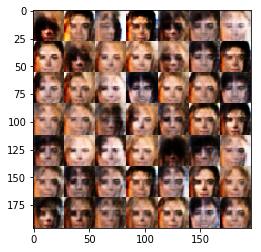

Epoch 1/1... Discriminator Loss: 1.1623... Generator Loss: 0.7666
Epoch 1/1... Discriminator Loss: 1.1824... Generator Loss: 0.8701
Epoch 1/1... Discriminator Loss: 1.4545... Generator Loss: 1.0844
Epoch 1/1... Discriminator Loss: 1.2772... Generator Loss: 0.9768
Epoch 1/1... Discriminator Loss: 1.2116... Generator Loss: 0.8562
Epoch 1/1... Discriminator Loss: 0.9927... Generator Loss: 0.9969
Epoch 1/1... Discriminator Loss: 1.0213... Generator Loss: 1.0151
Epoch 1/1... Discriminator Loss: 1.1705... Generator Loss: 0.8734
Epoch 1/1... Discriminator Loss: 1.2454... Generator Loss: 0.9688
Epoch 1/1... Discriminator Loss: 1.3256... Generator Loss: 0.9035
Epoch 1/1... Discriminator Loss: 1.2612... Generator Loss: 1.1448
Epoch 1/1... Discriminator Loss: 0.9109... Generator Loss: 1.4465


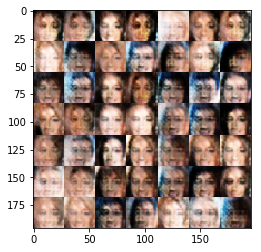

Epoch 1/1... Discriminator Loss: 1.1781... Generator Loss: 0.8852
Epoch 1/1... Discriminator Loss: 0.8555... Generator Loss: 1.5217
Epoch 1/1... Discriminator Loss: 1.1243... Generator Loss: 1.0143
Epoch 1/1... Discriminator Loss: 0.9538... Generator Loss: 1.0025
Epoch 1/1... Discriminator Loss: 1.0515... Generator Loss: 0.9157
Epoch 1/1... Discriminator Loss: 0.7772... Generator Loss: 1.2819
Epoch 1/1... Discriminator Loss: 1.1542... Generator Loss: 0.6300
Epoch 1/1... Discriminator Loss: 1.2863... Generator Loss: 1.0230
Epoch 1/1... Discriminator Loss: 1.2805... Generator Loss: 0.9553
Epoch 1/1... Discriminator Loss: 1.1897... Generator Loss: 0.7296
Epoch 1/1... Discriminator Loss: 1.1401... Generator Loss: 1.0253
Epoch 1/1... Discriminator Loss: 1.1434... Generator Loss: 0.7229


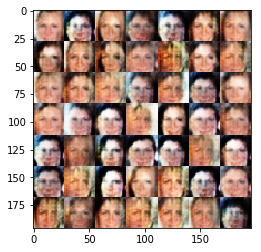

Epoch 1/1... Discriminator Loss: 1.4943... Generator Loss: 0.7107
Epoch 1/1... Discriminator Loss: 1.1464... Generator Loss: 0.8755
Epoch 1/1... Discriminator Loss: 1.2019... Generator Loss: 0.7271
Epoch 1/1... Discriminator Loss: 1.5870... Generator Loss: 0.7134
Epoch 1/1... Discriminator Loss: 0.9690... Generator Loss: 1.0135
Epoch 1/1... Discriminator Loss: 0.9135... Generator Loss: 1.1865
Epoch 1/1... Discriminator Loss: 1.4389... Generator Loss: 0.8669
Epoch 1/1... Discriminator Loss: 1.2726... Generator Loss: 1.2129
Epoch 1/1... Discriminator Loss: 1.3158... Generator Loss: 1.7790
Epoch 1/1... Discriminator Loss: 1.2122... Generator Loss: 0.9152
Epoch 1/1... Discriminator Loss: 1.2259... Generator Loss: 0.8503
Epoch 1/1... Discriminator Loss: 1.1247... Generator Loss: 0.6453


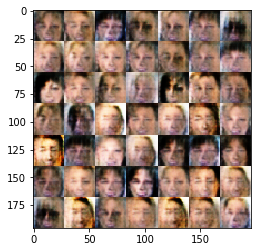

Epoch 1/1... Discriminator Loss: 1.3170... Generator Loss: 1.0362
Epoch 1/1... Discriminator Loss: 1.3865... Generator Loss: 0.8844
Epoch 1/1... Discriminator Loss: 1.4302... Generator Loss: 0.5876
Epoch 1/1... Discriminator Loss: 1.2557... Generator Loss: 0.5452
Epoch 1/1... Discriminator Loss: 1.1959... Generator Loss: 0.6706
Epoch 1/1... Discriminator Loss: 1.1157... Generator Loss: 1.2197
Epoch 1/1... Discriminator Loss: 1.3342... Generator Loss: 0.9666
Epoch 1/1... Discriminator Loss: 1.2441... Generator Loss: 0.9772
Epoch 1/1... Discriminator Loss: 0.8356... Generator Loss: 1.2940
Epoch 1/1... Discriminator Loss: 1.1009... Generator Loss: 0.9922
Epoch 1/1... Discriminator Loss: 1.0049... Generator Loss: 1.4233
Epoch 1/1... Discriminator Loss: 1.3446... Generator Loss: 0.7815


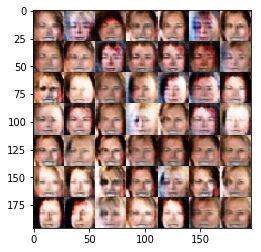

Epoch 1/1... Discriminator Loss: 1.2860... Generator Loss: 0.8350
Epoch 1/1... Discriminator Loss: 1.1958... Generator Loss: 0.6163
Epoch 1/1... Discriminator Loss: 1.4453... Generator Loss: 0.9039
Epoch 1/1... Discriminator Loss: 1.2395... Generator Loss: 0.8689
Epoch 1/1... Discriminator Loss: 1.0916... Generator Loss: 0.7690
Epoch 1/1... Discriminator Loss: 1.2184... Generator Loss: 0.8270
Epoch 1/1... Discriminator Loss: 1.1040... Generator Loss: 0.9642
Epoch 1/1... Discriminator Loss: 1.1293... Generator Loss: 0.7784
Epoch 1/1... Discriminator Loss: 1.3220... Generator Loss: 1.0857
Epoch 1/1... Discriminator Loss: 1.1687... Generator Loss: 0.8058
Epoch 1/1... Discriminator Loss: 0.9933... Generator Loss: 1.1816
Epoch 1/1... Discriminator Loss: 1.0188... Generator Loss: 0.9599


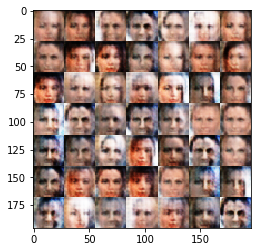

Epoch 1/1... Discriminator Loss: 1.2772... Generator Loss: 0.7616
Epoch 1/1... Discriminator Loss: 1.1753... Generator Loss: 0.8552
Epoch 1/1... Discriminator Loss: 0.9653... Generator Loss: 1.2315
Epoch 1/1... Discriminator Loss: 1.1644... Generator Loss: 0.7237
Epoch 1/1... Discriminator Loss: 1.1976... Generator Loss: 0.7683
Epoch 1/1... Discriminator Loss: 1.1829... Generator Loss: 0.8844
Epoch 1/1... Discriminator Loss: 1.0190... Generator Loss: 0.7215
Epoch 1/1... Discriminator Loss: 1.3217... Generator Loss: 0.4032
Epoch 1/1... Discriminator Loss: 1.2077... Generator Loss: 0.9459
Epoch 1/1... Discriminator Loss: 1.7358... Generator Loss: 0.6440
Epoch 1/1... Discriminator Loss: 1.2282... Generator Loss: 0.9598
Epoch 1/1... Discriminator Loss: 1.1887... Generator Loss: 0.7872


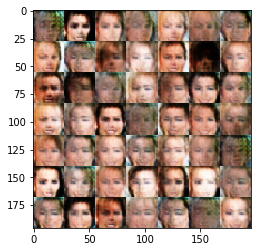

Epoch 1/1... Discriminator Loss: 1.2614... Generator Loss: 0.7438
Epoch 1/1... Discriminator Loss: 1.1559... Generator Loss: 0.8276
Epoch 1/1... Discriminator Loss: 1.5501... Generator Loss: 0.4707
Epoch 1/1... Discriminator Loss: 1.4383... Generator Loss: 0.6120
Epoch 1/1... Discriminator Loss: 1.5139... Generator Loss: 0.6433
Epoch 1/1... Discriminator Loss: 1.1103... Generator Loss: 1.2830
Epoch 1/1... Discriminator Loss: 1.1227... Generator Loss: 0.8106
Epoch 1/1... Discriminator Loss: 1.0971... Generator Loss: 0.8101
Epoch 1/1... Discriminator Loss: 1.2765... Generator Loss: 0.8043
Epoch 1/1... Discriminator Loss: 1.2230... Generator Loss: 1.0704
Epoch 1/1... Discriminator Loss: 1.2263... Generator Loss: 0.8237
Epoch 1/1... Discriminator Loss: 1.1699... Generator Loss: 0.9713


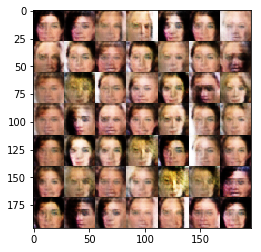

Epoch 1/1... Discriminator Loss: 1.1550... Generator Loss: 0.9133
Epoch 1/1... Discriminator Loss: 1.1621... Generator Loss: 0.6828
Epoch 1/1... Discriminator Loss: 1.3981... Generator Loss: 1.3813
Epoch 1/1... Discriminator Loss: 1.4692... Generator Loss: 0.3638
Epoch 1/1... Discriminator Loss: 0.9989... Generator Loss: 0.9373
Epoch 1/1... Discriminator Loss: 1.2815... Generator Loss: 0.5480
Epoch 1/1... Discriminator Loss: 0.9610... Generator Loss: 1.1038
Epoch 1/1... Discriminator Loss: 1.4453... Generator Loss: 0.9656
Epoch 1/1... Discriminator Loss: 1.3229... Generator Loss: 0.5758
Epoch 1/1... Discriminator Loss: 1.4126... Generator Loss: 0.6738
Epoch 1/1... Discriminator Loss: 1.2571... Generator Loss: 0.8104
Epoch 1/1... Discriminator Loss: 1.4863... Generator Loss: 1.0510


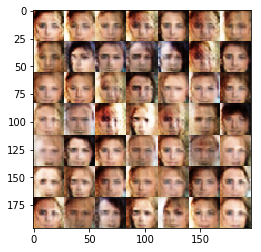

Epoch 1/1... Discriminator Loss: 1.1662... Generator Loss: 0.9301
Epoch 1/1... Discriminator Loss: 1.0456... Generator Loss: 0.8036
Epoch 1/1... Discriminator Loss: 1.2715... Generator Loss: 0.9372
Epoch 1/1... Discriminator Loss: 1.2075... Generator Loss: 0.9102
Epoch 1/1... Discriminator Loss: 1.3888... Generator Loss: 0.7266
Epoch 1/1... Discriminator Loss: 1.4768... Generator Loss: 0.5761
Epoch 1/1... Discriminator Loss: 1.2729... Generator Loss: 0.9298
Epoch 1/1... Discriminator Loss: 1.2091... Generator Loss: 0.8635
Epoch 1/1... Discriminator Loss: 1.2439... Generator Loss: 0.7960
Epoch 1/1... Discriminator Loss: 1.5073... Generator Loss: 0.8792
Epoch 1/1... Discriminator Loss: 1.4262... Generator Loss: 0.8388
Epoch 1/1... Discriminator Loss: 1.3085... Generator Loss: 0.7529


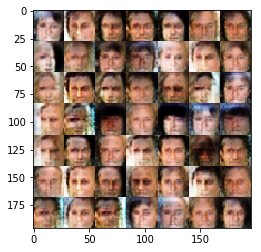

Epoch 1/1... Discriminator Loss: 1.2417... Generator Loss: 0.8915
Epoch 1/1... Discriminator Loss: 1.4519... Generator Loss: 0.6294
Epoch 1/1... Discriminator Loss: 1.1764... Generator Loss: 0.9915
Epoch 1/1... Discriminator Loss: 1.2011... Generator Loss: 0.9852
Epoch 1/1... Discriminator Loss: 1.3081... Generator Loss: 0.6171
Epoch 1/1... Discriminator Loss: 1.3188... Generator Loss: 1.0658
Epoch 1/1... Discriminator Loss: 1.2017... Generator Loss: 1.0570
Epoch 1/1... Discriminator Loss: 1.0183... Generator Loss: 0.7626
Epoch 1/1... Discriminator Loss: 1.0967... Generator Loss: 0.7502
Epoch 1/1... Discriminator Loss: 1.4315... Generator Loss: 0.9405
Epoch 1/1... Discriminator Loss: 1.2416... Generator Loss: 0.8208
Epoch 1/1... Discriminator Loss: 1.2225... Generator Loss: 0.5781


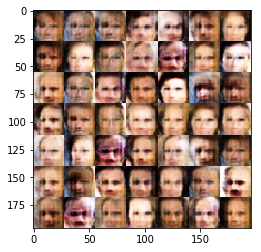

Epoch 1/1... Discriminator Loss: 1.2532... Generator Loss: 0.6664
Epoch 1/1... Discriminator Loss: 1.1299... Generator Loss: 0.7088
Epoch 1/1... Discriminator Loss: 1.4971... Generator Loss: 0.6526
Epoch 1/1... Discriminator Loss: 1.4021... Generator Loss: 0.7324
Epoch 1/1... Discriminator Loss: 1.1694... Generator Loss: 0.8431
Epoch 1/1... Discriminator Loss: 1.3352... Generator Loss: 0.9494
Epoch 1/1... Discriminator Loss: 1.1615... Generator Loss: 1.0895
Epoch 1/1... Discriminator Loss: 1.3020... Generator Loss: 0.6925
Epoch 1/1... Discriminator Loss: 1.2354... Generator Loss: 0.7715
Epoch 1/1... Discriminator Loss: 1.1703... Generator Loss: 0.7956
Epoch 1/1... Discriminator Loss: 1.2472... Generator Loss: 0.8324
Epoch 1/1... Discriminator Loss: 1.4925... Generator Loss: 0.4576


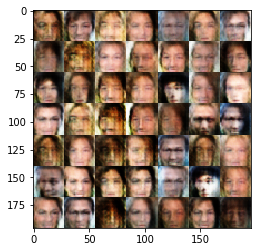

Epoch 1/1... Discriminator Loss: 1.5172... Generator Loss: 0.5785
Epoch 1/1... Discriminator Loss: 1.2948... Generator Loss: 0.8953
Epoch 1/1... Discriminator Loss: 1.3224... Generator Loss: 0.9329
Epoch 1/1... Discriminator Loss: 1.0502... Generator Loss: 0.8197
Epoch 1/1... Discriminator Loss: 1.3154... Generator Loss: 0.9132
Epoch 1/1... Discriminator Loss: 1.2151... Generator Loss: 0.6348
Epoch 1/1... Discriminator Loss: 1.4007... Generator Loss: 0.7219
Epoch 1/1... Discriminator Loss: 1.1096... Generator Loss: 1.0528
Epoch 1/1... Discriminator Loss: 1.4103... Generator Loss: 0.8223
Epoch 1/1... Discriminator Loss: 1.5504... Generator Loss: 0.4437
Epoch 1/1... Discriminator Loss: 1.1819... Generator Loss: 0.7450
Epoch 1/1... Discriminator Loss: 1.2986... Generator Loss: 0.8168


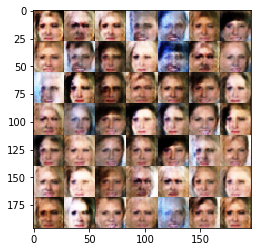

Epoch 1/1... Discriminator Loss: 1.1908... Generator Loss: 0.8111
Epoch 1/1... Discriminator Loss: 1.3887... Generator Loss: 0.9440
Epoch 1/1... Discriminator Loss: 1.3664... Generator Loss: 0.8780
Epoch 1/1... Discriminator Loss: 1.1534... Generator Loss: 0.9187
Epoch 1/1... Discriminator Loss: 1.1407... Generator Loss: 0.7507
Epoch 1/1... Discriminator Loss: 1.3798... Generator Loss: 0.6800
Epoch 1/1... Discriminator Loss: 1.2145... Generator Loss: 0.7912
Epoch 1/1... Discriminator Loss: 1.2996... Generator Loss: 0.6916
Epoch 1/1... Discriminator Loss: 1.5406... Generator Loss: 0.5493
Epoch 1/1... Discriminator Loss: 1.1885... Generator Loss: 0.6277
Epoch 1/1... Discriminator Loss: 1.4362... Generator Loss: 0.7340
Epoch 1/1... Discriminator Loss: 0.9668... Generator Loss: 1.0322


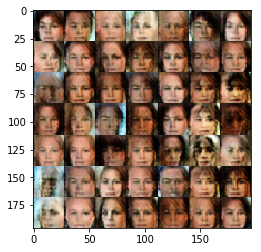

Epoch 1/1... Discriminator Loss: 1.5036... Generator Loss: 0.5535
Epoch 1/1... Discriminator Loss: 1.2842... Generator Loss: 0.5412
Epoch 1/1... Discriminator Loss: 1.2284... Generator Loss: 0.9254
Epoch 1/1... Discriminator Loss: 1.2119... Generator Loss: 0.7508
Epoch 1/1... Discriminator Loss: 1.2453... Generator Loss: 0.8647
Epoch 1/1... Discriminator Loss: 1.2744... Generator Loss: 0.6762
Epoch 1/1... Discriminator Loss: 1.2225... Generator Loss: 0.6537
Epoch 1/1... Discriminator Loss: 1.1383... Generator Loss: 1.1946
Epoch 1/1... Discriminator Loss: 1.1900... Generator Loss: 0.8877
Epoch 1/1... Discriminator Loss: 1.2683... Generator Loss: 0.8165
Epoch 1/1... Discriminator Loss: 1.1067... Generator Loss: 0.8691
Epoch 1/1... Discriminator Loss: 1.4405... Generator Loss: 0.7189


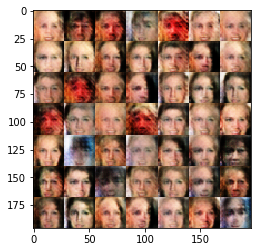

Epoch 1/1... Discriminator Loss: 1.5054... Generator Loss: 0.7518
Epoch 1/1... Discriminator Loss: 1.3015... Generator Loss: 0.9988
Epoch 1/1... Discriminator Loss: 0.9347... Generator Loss: 0.7938
Epoch 1/1... Discriminator Loss: 1.3088... Generator Loss: 0.9202
Epoch 1/1... Discriminator Loss: 1.3120... Generator Loss: 1.0343
Epoch 1/1... Discriminator Loss: 1.2941... Generator Loss: 0.6635
Epoch 1/1... Discriminator Loss: 1.2409... Generator Loss: 0.8600
Epoch 1/1... Discriminator Loss: 1.1250... Generator Loss: 0.7736
Epoch 1/1... Discriminator Loss: 1.3098... Generator Loss: 0.7613
Epoch 1/1... Discriminator Loss: 1.5220... Generator Loss: 0.6429
Epoch 1/1... Discriminator Loss: 1.5174... Generator Loss: 0.7022
Epoch 1/1... Discriminator Loss: 1.1988... Generator Loss: 0.8582


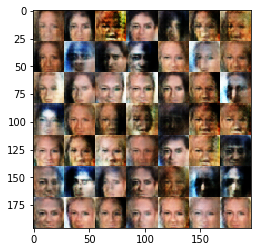

Epoch 1/1... Discriminator Loss: 1.2576... Generator Loss: 0.8106
Epoch 1/1... Discriminator Loss: 1.1899... Generator Loss: 0.8335
Epoch 1/1... Discriminator Loss: 1.3482... Generator Loss: 0.8212
Epoch 1/1... Discriminator Loss: 1.2351... Generator Loss: 0.7756
Epoch 1/1... Discriminator Loss: 1.2625... Generator Loss: 0.8641
Epoch 1/1... Discriminator Loss: 1.3448... Generator Loss: 0.7860
Epoch 1/1... Discriminator Loss: 1.1280... Generator Loss: 0.9481
Epoch 1/1... Discriminator Loss: 1.0981... Generator Loss: 0.8362
Epoch 1/1... Discriminator Loss: 1.2815... Generator Loss: 0.6899
Epoch 1/1... Discriminator Loss: 1.3051... Generator Loss: 0.9565
Epoch 1/1... Discriminator Loss: 1.3791... Generator Loss: 1.0970
Epoch 1/1... Discriminator Loss: 1.3942... Generator Loss: 0.8700


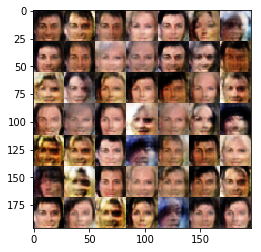

Epoch 1/1... Discriminator Loss: 1.4518... Generator Loss: 0.6845
Epoch 1/1... Discriminator Loss: 1.1366... Generator Loss: 0.7534
Epoch 1/1... Discriminator Loss: 1.3466... Generator Loss: 1.1748
Epoch 1/1... Discriminator Loss: 1.3420... Generator Loss: 0.7839
Epoch 1/1... Discriminator Loss: 1.3065... Generator Loss: 0.7442
Epoch 1/1... Discriminator Loss: 1.2931... Generator Loss: 0.9406
Epoch 1/1... Discriminator Loss: 1.4262... Generator Loss: 0.7072
Epoch 1/1... Discriminator Loss: 1.2978... Generator Loss: 0.7849
Epoch 1/1... Discriminator Loss: 1.3310... Generator Loss: 0.9456
Epoch 1/1... Discriminator Loss: 1.3547... Generator Loss: 0.7141
Epoch 1/1... Discriminator Loss: 1.3005... Generator Loss: 0.8138
Epoch 1/1... Discriminator Loss: 1.1814... Generator Loss: 0.7672


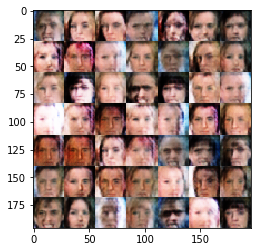

Epoch 1/1... Discriminator Loss: 1.0169... Generator Loss: 0.8905
Epoch 1/1... Discriminator Loss: 1.1882... Generator Loss: 1.3210
Epoch 1/1... Discriminator Loss: 1.2538... Generator Loss: 0.7961
Epoch 1/1... Discriminator Loss: 1.5310... Generator Loss: 0.7571
Epoch 1/1... Discriminator Loss: 1.0464... Generator Loss: 1.1744
Epoch 1/1... Discriminator Loss: 1.3128... Generator Loss: 0.5365
Epoch 1/1... Discriminator Loss: 1.3369... Generator Loss: 0.7905
Epoch 1/1... Discriminator Loss: 1.1352... Generator Loss: 0.8930
Epoch 1/1... Discriminator Loss: 1.2501... Generator Loss: 0.7892
Epoch 1/1... Discriminator Loss: 1.0610... Generator Loss: 1.1548
Epoch 1/1... Discriminator Loss: 1.3452... Generator Loss: 0.7292
Epoch 1/1... Discriminator Loss: 1.4784... Generator Loss: 0.6259


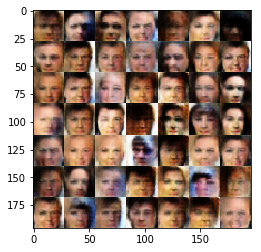

Epoch 1/1... Discriminator Loss: 1.1253... Generator Loss: 1.0995
Epoch 1/1... Discriminator Loss: 1.1989... Generator Loss: 0.6782
Epoch 1/1... Discriminator Loss: 1.1687... Generator Loss: 1.1496
Epoch 1/1... Discriminator Loss: 1.4103... Generator Loss: 0.6474
Epoch 1/1... Discriminator Loss: 1.4601... Generator Loss: 0.6294
Epoch 1/1... Discriminator Loss: 1.4049... Generator Loss: 0.7134
Epoch 1/1... Discriminator Loss: 1.4733... Generator Loss: 0.8281
Epoch 1/1... Discriminator Loss: 1.3862... Generator Loss: 0.6469
Epoch 1/1... Discriminator Loss: 1.1673... Generator Loss: 0.8316
Epoch 1/1... Discriminator Loss: 1.2264... Generator Loss: 0.6307
Epoch 1/1... Discriminator Loss: 1.5055... Generator Loss: 0.8190
Epoch 1/1... Discriminator Loss: 1.2598... Generator Loss: 0.7272


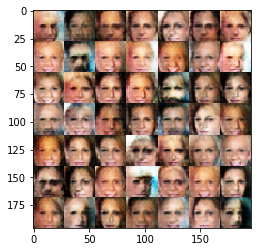

Epoch 1/1... Discriminator Loss: 1.4105... Generator Loss: 0.8023
Epoch 1/1... Discriminator Loss: 1.5363... Generator Loss: 0.8877
Epoch 1/1... Discriminator Loss: 1.3907... Generator Loss: 0.6652
Epoch 1/1... Discriminator Loss: 1.3050... Generator Loss: 0.8223
Epoch 1/1... Discriminator Loss: 1.2465... Generator Loss: 1.1568
Epoch 1/1... Discriminator Loss: 1.2257... Generator Loss: 0.6140
Epoch 1/1... Discriminator Loss: 1.3317... Generator Loss: 0.7616
Epoch 1/1... Discriminator Loss: 1.1967... Generator Loss: 0.9865
Epoch 1/1... Discriminator Loss: 1.3485... Generator Loss: 1.0652
Epoch 1/1... Discriminator Loss: 1.5199... Generator Loss: 0.5863
Epoch 1/1... Discriminator Loss: 1.1170... Generator Loss: 0.9922
Epoch 1/1... Discriminator Loss: 1.2250... Generator Loss: 0.9288


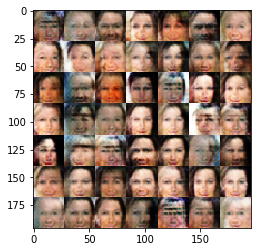

Epoch 1/1... Discriminator Loss: 1.1742... Generator Loss: 1.0216
Epoch 1/1... Discriminator Loss: 1.1296... Generator Loss: 0.8038
Epoch 1/1... Discriminator Loss: 1.5075... Generator Loss: 0.5533
Epoch 1/1... Discriminator Loss: 1.2566... Generator Loss: 1.1859
Epoch 1/1... Discriminator Loss: 0.9110... Generator Loss: 1.0058
Epoch 1/1... Discriminator Loss: 1.0948... Generator Loss: 0.7151
Epoch 1/1... Discriminator Loss: 1.3410... Generator Loss: 0.5062
Epoch 1/1... Discriminator Loss: 1.4181... Generator Loss: 0.8329
Epoch 1/1... Discriminator Loss: 1.3520... Generator Loss: 0.6916
Epoch 1/1... Discriminator Loss: 1.4532... Generator Loss: 0.7135
Epoch 1/1... Discriminator Loss: 1.2477... Generator Loss: 0.8175
Epoch 1/1... Discriminator Loss: 1.5515... Generator Loss: 0.8128


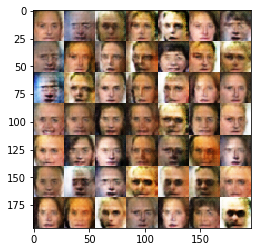

Epoch 1/1... Discriminator Loss: 1.4947... Generator Loss: 0.8382
Epoch 1/1... Discriminator Loss: 1.3603... Generator Loss: 0.6374
Epoch 1/1... Discriminator Loss: 1.1793... Generator Loss: 0.6453
Epoch 1/1... Discriminator Loss: 1.5540... Generator Loss: 0.8263
Epoch 1/1... Discriminator Loss: 1.2993... Generator Loss: 0.7072
Epoch 1/1... Discriminator Loss: 1.3305... Generator Loss: 0.5475
Epoch 1/1... Discriminator Loss: 1.2772... Generator Loss: 0.8032
Epoch 1/1... Discriminator Loss: 1.3273... Generator Loss: 0.6600
Epoch 1/1... Discriminator Loss: 1.3328... Generator Loss: 0.5707
Epoch 1/1... Discriminator Loss: 1.2741... Generator Loss: 0.7592
Epoch 1/1... Discriminator Loss: 1.5269... Generator Loss: 0.8952
Epoch 1/1... Discriminator Loss: 1.2783... Generator Loss: 0.7324


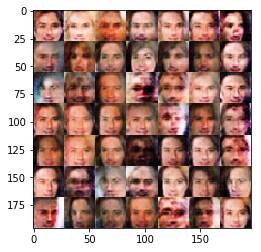

Epoch 1/1... Discriminator Loss: 1.1978... Generator Loss: 0.7487
Epoch 1/1... Discriminator Loss: 1.0776... Generator Loss: 0.9875
Epoch 1/1... Discriminator Loss: 1.0969... Generator Loss: 0.8807
Epoch 1/1... Discriminator Loss: 1.5442... Generator Loss: 0.6053
Epoch 1/1... Discriminator Loss: 1.2032... Generator Loss: 1.1216
Epoch 1/1... Discriminator Loss: 1.1505... Generator Loss: 0.7156
Epoch 1/1... Discriminator Loss: 1.2797... Generator Loss: 1.0265
Epoch 1/1... Discriminator Loss: 1.1439... Generator Loss: 0.9872
Epoch 1/1... Discriminator Loss: 1.3090... Generator Loss: 0.9690
Epoch 1/1... Discriminator Loss: 1.2218... Generator Loss: 0.7351
Epoch 1/1... Discriminator Loss: 1.2338... Generator Loss: 0.6069
Epoch 1/1... Discriminator Loss: 1.5422... Generator Loss: 0.7083


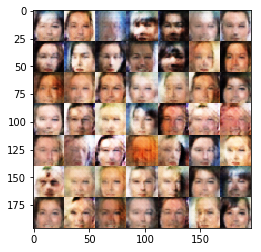

Epoch 1/1... Discriminator Loss: 1.2276... Generator Loss: 0.6855
Epoch 1/1... Discriminator Loss: 1.1735... Generator Loss: 0.7656
Epoch 1/1... Discriminator Loss: 1.3674... Generator Loss: 0.6613
Epoch 1/1... Discriminator Loss: 1.4516... Generator Loss: 0.7405
Epoch 1/1... Discriminator Loss: 1.3684... Generator Loss: 0.8102
Epoch 1/1... Discriminator Loss: 1.2126... Generator Loss: 0.6643
Epoch 1/1... Discriminator Loss: 1.4483... Generator Loss: 0.8194
Epoch 1/1... Discriminator Loss: 1.4726... Generator Loss: 0.5909
Epoch 1/1... Discriminator Loss: 1.2858... Generator Loss: 0.8789
Epoch 1/1... Discriminator Loss: 1.2417... Generator Loss: 0.9753
Epoch 1/1... Discriminator Loss: 1.1596... Generator Loss: 1.1017
Epoch 1/1... Discriminator Loss: 1.4307... Generator Loss: 0.6220


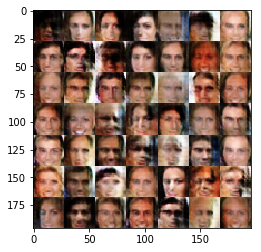

Epoch 1/1... Discriminator Loss: 1.3414... Generator Loss: 0.7502
Epoch 1/1... Discriminator Loss: 1.3093... Generator Loss: 0.7662
Epoch 1/1... Discriminator Loss: 1.4252... Generator Loss: 0.6637
Epoch 1/1... Discriminator Loss: 1.2667... Generator Loss: 0.6777
Epoch 1/1... Discriminator Loss: 1.1704... Generator Loss: 0.9673
Epoch 1/1... Discriminator Loss: 1.3460... Generator Loss: 0.8625
Epoch 1/1... Discriminator Loss: 1.2666... Generator Loss: 0.8640
Epoch 1/1... Discriminator Loss: 1.1428... Generator Loss: 1.0517
Epoch 1/1... Discriminator Loss: 1.2662... Generator Loss: 0.8407
Epoch 1/1... Discriminator Loss: 1.2826... Generator Loss: 0.8294
Epoch 1/1... Discriminator Loss: 1.4357... Generator Loss: 0.6177
Epoch 1/1... Discriminator Loss: 1.3009... Generator Loss: 0.7510


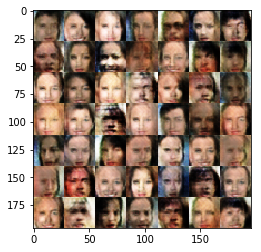

Epoch 1/1... Discriminator Loss: 1.2397... Generator Loss: 0.7587
Epoch 1/1... Discriminator Loss: 1.4570... Generator Loss: 0.6688
Epoch 1/1... Discriminator Loss: 1.2317... Generator Loss: 0.6773
Epoch 1/1... Discriminator Loss: 1.5107... Generator Loss: 0.6347
Epoch 1/1... Discriminator Loss: 1.2247... Generator Loss: 1.0234
Epoch 1/1... Discriminator Loss: 1.2831... Generator Loss: 0.8806
Epoch 1/1... Discriminator Loss: 1.0738... Generator Loss: 1.0108
Epoch 1/1... Discriminator Loss: 1.5800... Generator Loss: 0.4954
Epoch 1/1... Discriminator Loss: 1.3266... Generator Loss: 0.7109
Epoch 1/1... Discriminator Loss: 1.3834... Generator Loss: 0.7887
Epoch 1/1... Discriminator Loss: 1.3889... Generator Loss: 0.7141
Epoch 1/1... Discriminator Loss: 1.4905... Generator Loss: 0.7078


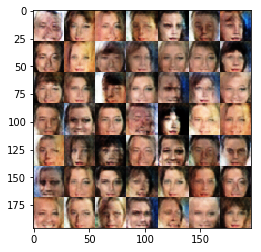

Epoch 1/1... Discriminator Loss: 1.3562... Generator Loss: 0.8462
Epoch 1/1... Discriminator Loss: 1.3323... Generator Loss: 0.7664
Epoch 1/1... Discriminator Loss: 1.0552... Generator Loss: 0.9187
Epoch 1/1... Discriminator Loss: 1.2836... Generator Loss: 0.8627
Epoch 1/1... Discriminator Loss: 1.3177... Generator Loss: 0.9477
Epoch 1/1... Discriminator Loss: 1.3140... Generator Loss: 0.6896
Epoch 1/1... Discriminator Loss: 1.3501... Generator Loss: 0.9139
Epoch 1/1... Discriminator Loss: 1.2779... Generator Loss: 0.8335
Epoch 1/1... Discriminator Loss: 1.2708... Generator Loss: 0.7692
Epoch 1/1... Discriminator Loss: 1.3633... Generator Loss: 0.8026
Epoch 1/1... Discriminator Loss: 1.4268... Generator Loss: 0.7050
Epoch 1/1... Discriminator Loss: 1.3318... Generator Loss: 1.0062


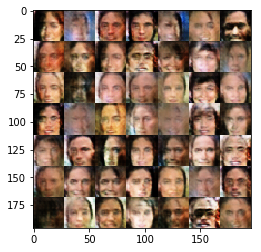

Epoch 1/1... Discriminator Loss: 1.5783... Generator Loss: 0.6959
Epoch 1/1... Discriminator Loss: 1.2352... Generator Loss: 0.7547
Epoch 1/1... Discriminator Loss: 1.3981... Generator Loss: 0.7759
Epoch 1/1... Discriminator Loss: 1.3237... Generator Loss: 0.7811
Epoch 1/1... Discriminator Loss: 1.3046... Generator Loss: 0.7022
Epoch 1/1... Discriminator Loss: 1.5336... Generator Loss: 0.6417
Epoch 1/1... Discriminator Loss: 1.2353... Generator Loss: 0.7143
Epoch 1/1... Discriminator Loss: 1.2124... Generator Loss: 0.8981
Epoch 1/1... Discriminator Loss: 1.3221... Generator Loss: 0.7167
Epoch 1/1... Discriminator Loss: 1.3100... Generator Loss: 0.7692
Epoch 1/1... Discriminator Loss: 1.2911... Generator Loss: 0.9532
Epoch 1/1... Discriminator Loss: 1.2914... Generator Loss: 0.6504


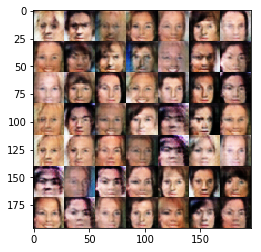

Epoch 1/1... Discriminator Loss: 1.4434... Generator Loss: 0.8259
Epoch 1/1... Discriminator Loss: 1.3930... Generator Loss: 0.6013
Epoch 1/1... Discriminator Loss: 1.2519... Generator Loss: 1.0170
Epoch 1/1... Discriminator Loss: 1.0929... Generator Loss: 0.8484
Epoch 1/1... Discriminator Loss: 1.4215... Generator Loss: 0.7965
Epoch 1/1... Discriminator Loss: 1.2693... Generator Loss: 0.8263
Epoch 1/1... Discriminator Loss: 1.1678... Generator Loss: 0.8928
Epoch 1/1... Discriminator Loss: 1.3095... Generator Loss: 0.7082
Epoch 1/1... Discriminator Loss: 1.3811... Generator Loss: 0.7772
Epoch 1/1... Discriminator Loss: 1.4233... Generator Loss: 0.6107
Epoch 1/1... Discriminator Loss: 1.3931... Generator Loss: 0.7097
Epoch 1/1... Discriminator Loss: 1.3562... Generator Loss: 0.8241


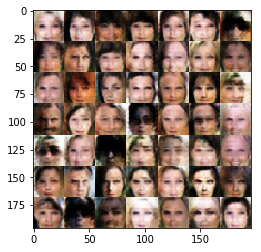

Epoch 1/1... Discriminator Loss: 1.2507... Generator Loss: 0.7684
Epoch 1/1... Discriminator Loss: 1.0937... Generator Loss: 0.7639
Epoch 1/1... Discriminator Loss: 1.3431... Generator Loss: 0.6650
Epoch 1/1... Discriminator Loss: 1.3719... Generator Loss: 0.6920
Epoch 1/1... Discriminator Loss: 1.1743... Generator Loss: 0.8860
Epoch 1/1... Discriminator Loss: 1.1406... Generator Loss: 1.1237
Epoch 1/1... Discriminator Loss: 1.5831... Generator Loss: 0.7498
Epoch 1/1... Discriminator Loss: 1.3447... Generator Loss: 0.6745
Epoch 1/1... Discriminator Loss: 1.2184... Generator Loss: 0.8894
Epoch 1/1... Discriminator Loss: 1.2970... Generator Loss: 0.9237
Epoch 1/1... Discriminator Loss: 1.3502... Generator Loss: 0.7258
Epoch 1/1... Discriminator Loss: 1.2974... Generator Loss: 0.6439


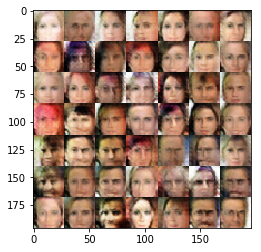

Epoch 1/1... Discriminator Loss: 1.2043... Generator Loss: 0.8936
Epoch 1/1... Discriminator Loss: 1.2007... Generator Loss: 0.7894
Epoch 1/1... Discriminator Loss: 1.3508... Generator Loss: 0.8326
Epoch 1/1... Discriminator Loss: 1.3851... Generator Loss: 0.7846
Epoch 1/1... Discriminator Loss: 1.3367... Generator Loss: 0.7042
Epoch 1/1... Discriminator Loss: 1.4839... Generator Loss: 0.7086
Epoch 1/1... Discriminator Loss: 1.3332... Generator Loss: 0.7401
Epoch 1/1... Discriminator Loss: 1.2550... Generator Loss: 0.8946
Epoch 1/1... Discriminator Loss: 1.4811... Generator Loss: 0.8017
Epoch 1/1... Discriminator Loss: 1.5429... Generator Loss: 0.7986
Epoch 1/1... Discriminator Loss: 1.2349... Generator Loss: 0.8770
Epoch 1/1... Discriminator Loss: 1.3304... Generator Loss: 0.6786


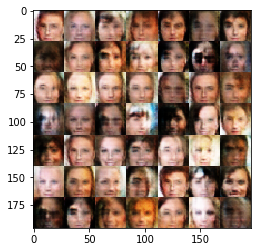

Epoch 1/1... Discriminator Loss: 1.2602... Generator Loss: 0.9853
Epoch 1/1... Discriminator Loss: 1.3405... Generator Loss: 0.7612
Epoch 1/1... Discriminator Loss: 1.0906... Generator Loss: 0.9632
Epoch 1/1... Discriminator Loss: 1.1528... Generator Loss: 0.8540
Epoch 1/1... Discriminator Loss: 1.1427... Generator Loss: 0.9900
Epoch 1/1... Discriminator Loss: 1.4306... Generator Loss: 0.6727
Epoch 1/1... Discriminator Loss: 1.3072... Generator Loss: 0.6738
Epoch 1/1... Discriminator Loss: 1.2081... Generator Loss: 0.7611
Epoch 1/1... Discriminator Loss: 1.3907... Generator Loss: 0.8924
Epoch 1/1... Discriminator Loss: 1.3148... Generator Loss: 0.6784
Epoch 1/1... Discriminator Loss: 1.3980... Generator Loss: 0.8638
Epoch 1/1... Discriminator Loss: 1.2803... Generator Loss: 0.8266


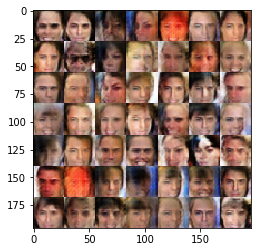

Epoch 1/1... Discriminator Loss: 1.3197... Generator Loss: 0.8173
Epoch 1/1... Discriminator Loss: 1.4139... Generator Loss: 0.9363
Epoch 1/1... Discriminator Loss: 1.4716... Generator Loss: 0.6990
Epoch 1/1... Discriminator Loss: 1.2922... Generator Loss: 0.7875
Epoch 1/1... Discriminator Loss: 1.3914... Generator Loss: 0.6192
Epoch 1/1... Discriminator Loss: 1.3416... Generator Loss: 0.7439
Epoch 1/1... Discriminator Loss: 1.3356... Generator Loss: 0.7185
Epoch 1/1... Discriminator Loss: 1.1305... Generator Loss: 0.8327
Epoch 1/1... Discriminator Loss: 1.1331... Generator Loss: 0.6991
Epoch 1/1... Discriminator Loss: 1.3577... Generator Loss: 0.6436
Epoch 1/1... Discriminator Loss: 1.2417... Generator Loss: 0.7958
Epoch 1/1... Discriminator Loss: 1.3927... Generator Loss: 0.8804


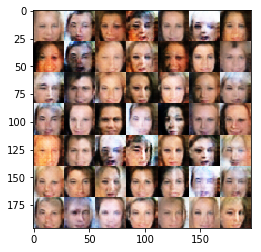

Epoch 1/1... Discriminator Loss: 1.1232... Generator Loss: 0.8334
Epoch 1/1... Discriminator Loss: 1.3934... Generator Loss: 0.6818
Epoch 1/1... Discriminator Loss: 1.2724... Generator Loss: 0.8154
Epoch 1/1... Discriminator Loss: 1.1160... Generator Loss: 0.6919
Epoch 1/1... Discriminator Loss: 1.1222... Generator Loss: 0.8314
Epoch 1/1... Discriminator Loss: 1.2773... Generator Loss: 0.7013
Epoch 1/1... Discriminator Loss: 1.3749... Generator Loss: 0.7380
Epoch 1/1... Discriminator Loss: 1.3185... Generator Loss: 0.5628
Epoch 1/1... Discriminator Loss: 1.1727... Generator Loss: 0.6714
Epoch 1/1... Discriminator Loss: 1.2526... Generator Loss: 0.9158
Epoch 1/1... Discriminator Loss: 1.4536... Generator Loss: 0.7466
Epoch 1/1... Discriminator Loss: 1.3001... Generator Loss: 0.8300


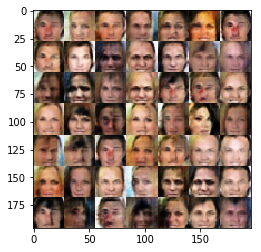

Epoch 1/1... Discriminator Loss: 1.3514... Generator Loss: 0.8025
Epoch 1/1... Discriminator Loss: 1.3830... Generator Loss: 0.6611
Epoch 1/1... Discriminator Loss: 1.2551... Generator Loss: 0.7210
Epoch 1/1... Discriminator Loss: 1.2445... Generator Loss: 0.7948
Epoch 1/1... Discriminator Loss: 1.4158... Generator Loss: 0.6794
Epoch 1/1... Discriminator Loss: 1.1587... Generator Loss: 0.9834
Epoch 1/1... Discriminator Loss: 1.3329... Generator Loss: 0.7460
Epoch 1/1... Discriminator Loss: 1.4687... Generator Loss: 0.7950
Epoch 1/1... Discriminator Loss: 1.3018... Generator Loss: 0.6439
Epoch 1/1... Discriminator Loss: 1.5403... Generator Loss: 0.6018
Epoch 1/1... Discriminator Loss: 1.5679... Generator Loss: 0.5435
Epoch 1/1... Discriminator Loss: 1.1473... Generator Loss: 0.8109


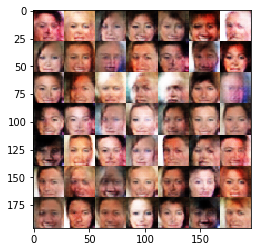

Epoch 1/1... Discriminator Loss: 1.2764... Generator Loss: 0.9350
Epoch 1/1... Discriminator Loss: 1.2760... Generator Loss: 0.8420
Epoch 1/1... Discriminator Loss: 1.2621... Generator Loss: 0.7178
Epoch 1/1... Discriminator Loss: 1.2860... Generator Loss: 0.6530
Epoch 1/1... Discriminator Loss: 1.3390... Generator Loss: 0.7495
Epoch 1/1... Discriminator Loss: 1.3435... Generator Loss: 0.4802
Epoch 1/1... Discriminator Loss: 1.4931... Generator Loss: 0.8299
Epoch 1/1... Discriminator Loss: 1.3202... Generator Loss: 0.8242
Epoch 1/1... Discriminator Loss: 1.5424... Generator Loss: 0.5215
Epoch 1/1... Discriminator Loss: 1.5364... Generator Loss: 0.7112
Epoch 1/1... Discriminator Loss: 1.3194... Generator Loss: 0.7583
Epoch 1/1... Discriminator Loss: 1.1822... Generator Loss: 1.1128


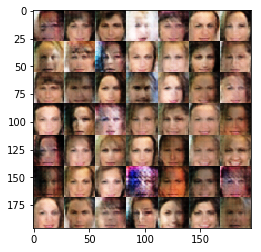

Epoch 1/1... Discriminator Loss: 1.1387... Generator Loss: 1.0361
Epoch 1/1... Discriminator Loss: 1.5772... Generator Loss: 1.1411
Epoch 1/1... Discriminator Loss: 1.4072... Generator Loss: 0.8216
Epoch 1/1... Discriminator Loss: 1.5305... Generator Loss: 0.4867
Epoch 1/1... Discriminator Loss: 1.2811... Generator Loss: 0.6541
Epoch 1/1... Discriminator Loss: 1.2151... Generator Loss: 0.7387
Epoch 1/1... Discriminator Loss: 1.4465... Generator Loss: 0.6946
Epoch 1/1... Discriminator Loss: 1.3486... Generator Loss: 0.9007
Epoch 1/1... Discriminator Loss: 1.1232... Generator Loss: 1.6456
Epoch 1/1... Discriminator Loss: 1.3539... Generator Loss: 0.8564
Epoch 1/1... Discriminator Loss: 1.1479... Generator Loss: 0.8901
Epoch 1/1... Discriminator Loss: 1.6304... Generator Loss: 0.7039


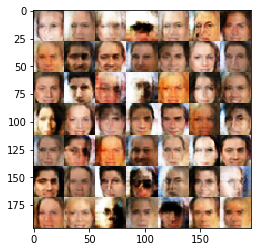

Epoch 1/1... Discriminator Loss: 1.3358... Generator Loss: 0.7379
Epoch 1/1... Discriminator Loss: 1.2250... Generator Loss: 0.9866
Epoch 1/1... Discriminator Loss: 1.1782... Generator Loss: 0.7328
Epoch 1/1... Discriminator Loss: 1.1679... Generator Loss: 0.9304
Epoch 1/1... Discriminator Loss: 1.4280... Generator Loss: 0.6693
Epoch 1/1... Discriminator Loss: 1.4870... Generator Loss: 0.7256
Epoch 1/1... Discriminator Loss: 1.5515... Generator Loss: 0.6618
Epoch 1/1... Discriminator Loss: 1.3027... Generator Loss: 0.8221
Epoch 1/1... Discriminator Loss: 1.2066... Generator Loss: 0.7486
Epoch 1/1... Discriminator Loss: 1.0530... Generator Loss: 0.7328
Epoch 1/1... Discriminator Loss: 1.1634... Generator Loss: 0.6446
Epoch 1/1... Discriminator Loss: 1.2691... Generator Loss: 1.1076


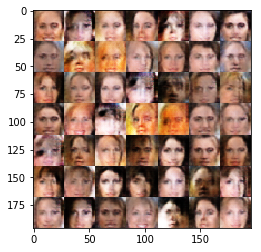

Epoch 1/1... Discriminator Loss: 1.2027... Generator Loss: 1.5968
Epoch 1/1... Discriminator Loss: 1.2139... Generator Loss: 0.6736
Epoch 1/1... Discriminator Loss: 1.4223... Generator Loss: 0.6508
Epoch 1/1... Discriminator Loss: 1.4437... Generator Loss: 0.7683
Epoch 1/1... Discriminator Loss: 1.5390... Generator Loss: 0.8897
Epoch 1/1... Discriminator Loss: 1.1933... Generator Loss: 0.8357
Epoch 1/1... Discriminator Loss: 1.1927... Generator Loss: 0.7644
Epoch 1/1... Discriminator Loss: 0.9148... Generator Loss: 1.1643
Epoch 1/1... Discriminator Loss: 0.9209... Generator Loss: 1.6820
Epoch 1/1... Discriminator Loss: 1.0969... Generator Loss: 0.9309
Epoch 1/1... Discriminator Loss: 1.3946... Generator Loss: 0.5170
Epoch 1/1... Discriminator Loss: 0.9962... Generator Loss: 1.0750


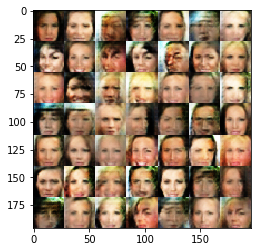

Epoch 1/1... Discriminator Loss: 1.3752... Generator Loss: 0.6307
Epoch 1/1... Discriminator Loss: 1.2939... Generator Loss: 0.7202
Epoch 1/1... Discriminator Loss: 1.2555... Generator Loss: 0.7075
Epoch 1/1... Discriminator Loss: 1.3807... Generator Loss: 0.8770
Epoch 1/1... Discriminator Loss: 1.4152... Generator Loss: 0.7668
Epoch 1/1... Discriminator Loss: 1.1060... Generator Loss: 0.9437
Epoch 1/1... Discriminator Loss: 1.2682... Generator Loss: 0.7536
Epoch 1/1... Discriminator Loss: 1.3912... Generator Loss: 0.6803
Epoch 1/1... Discriminator Loss: 1.4797... Generator Loss: 0.6270
Epoch 1/1... Discriminator Loss: 1.1463... Generator Loss: 0.7582
Epoch 1/1... Discriminator Loss: 1.2488... Generator Loss: 0.6139
Epoch 1/1... Discriminator Loss: 1.3844... Generator Loss: 0.6652


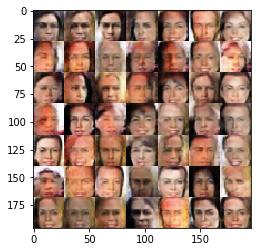

Epoch 1/1... Discriminator Loss: 1.3384... Generator Loss: 0.8224
Epoch 1/1... Discriminator Loss: 1.1788... Generator Loss: 0.8861
Epoch 1/1... Discriminator Loss: 1.2126... Generator Loss: 0.7803
Epoch 1/1... Discriminator Loss: 1.2866... Generator Loss: 0.8453
Epoch 1/1... Discriminator Loss: 1.2001... Generator Loss: 0.9127
Epoch 1/1... Discriminator Loss: 1.2779... Generator Loss: 0.8631
Epoch 1/1... Discriminator Loss: 1.3761... Generator Loss: 0.8268
Epoch 1/1... Discriminator Loss: 1.2125... Generator Loss: 0.8486
Epoch 1/1... Discriminator Loss: 1.1062... Generator Loss: 0.8037
Epoch 1/1... Discriminator Loss: 1.0372... Generator Loss: 1.3483
Epoch 1/1... Discriminator Loss: 0.9376... Generator Loss: 1.3190
Epoch 1/1... Discriminator Loss: 1.2703... Generator Loss: 0.5976


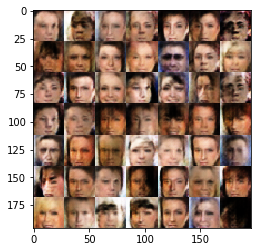

Epoch 1/1... Discriminator Loss: 1.1575... Generator Loss: 0.7454
Epoch 1/1... Discriminator Loss: 1.1524... Generator Loss: 0.7918
Epoch 1/1... Discriminator Loss: 1.2343... Generator Loss: 0.9752
Epoch 1/1... Discriminator Loss: 1.2691... Generator Loss: 0.8070
Epoch 1/1... Discriminator Loss: 1.2408... Generator Loss: 0.8669
Epoch 1/1... Discriminator Loss: 1.0224... Generator Loss: 0.9352
Epoch 1/1... Discriminator Loss: 1.2545... Generator Loss: 0.8121
Epoch 1/1... Discriminator Loss: 1.1680... Generator Loss: 0.7509
Epoch 1/1... Discriminator Loss: 1.2095... Generator Loss: 0.6529
Epoch 1/1... Discriminator Loss: 1.1359... Generator Loss: 0.9662
Epoch 1/1... Discriminator Loss: 1.5693... Generator Loss: 0.3431
Epoch 1/1... Discriminator Loss: 1.3247... Generator Loss: 0.9758


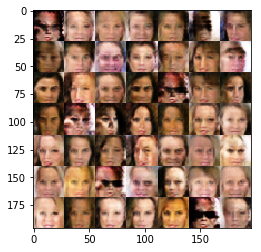

Epoch 1/1... Discriminator Loss: 1.4935... Generator Loss: 0.7507
Epoch 1/1... Discriminator Loss: 1.4992... Generator Loss: 0.6429
Epoch 1/1... Discriminator Loss: 1.2859... Generator Loss: 0.8920
Epoch 1/1... Discriminator Loss: 1.2431... Generator Loss: 0.9223
Epoch 1/1... Discriminator Loss: 1.2675... Generator Loss: 0.7960
Epoch 1/1... Discriminator Loss: 1.2932... Generator Loss: 0.7675
Epoch 1/1... Discriminator Loss: 1.5377... Generator Loss: 0.5775
Epoch 1/1... Discriminator Loss: 1.2927... Generator Loss: 0.6821
Epoch 1/1... Discriminator Loss: 1.3806... Generator Loss: 0.7477
Epoch 1/1... Discriminator Loss: 1.0795... Generator Loss: 0.7380
Epoch 1/1... Discriminator Loss: 1.4732... Generator Loss: 0.6079
Epoch 1/1... Discriminator Loss: 1.4281... Generator Loss: 0.5913


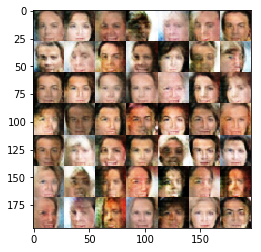

Epoch 1/1... Discriminator Loss: 1.3983... Generator Loss: 0.7232
Epoch 1/1... Discriminator Loss: 1.2838... Generator Loss: 0.8089
Epoch 1/1... Discriminator Loss: 1.2769... Generator Loss: 0.9669
Epoch 1/1... Discriminator Loss: 1.3365... Generator Loss: 0.9307
Epoch 1/1... Discriminator Loss: 1.5844... Generator Loss: 0.7263
Epoch 1/1... Discriminator Loss: 1.4801... Generator Loss: 0.6147
Epoch 1/1... Discriminator Loss: 1.2785... Generator Loss: 0.9953
Epoch 1/1... Discriminator Loss: 1.4105... Generator Loss: 0.8588
Epoch 1/1... Discriminator Loss: 1.2945... Generator Loss: 0.8970
Epoch 1/1... Discriminator Loss: 1.5531... Generator Loss: 0.8464
Epoch 1/1... Discriminator Loss: 1.7297... Generator Loss: 0.7088
Epoch 1/1... Discriminator Loss: 1.2354... Generator Loss: 0.7458


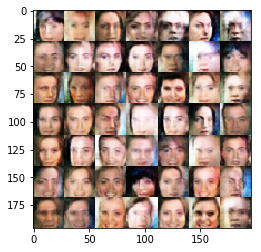

Epoch 1/1... Discriminator Loss: 1.2116... Generator Loss: 0.8239
Epoch 1/1... Discriminator Loss: 1.3717... Generator Loss: 0.8571
Epoch 1/1... Discriminator Loss: 1.3540... Generator Loss: 0.6840
Epoch 1/1... Discriminator Loss: 1.3246... Generator Loss: 0.6090
Epoch 1/1... Discriminator Loss: 1.2787... Generator Loss: 0.7927
Epoch 1/1... Discriminator Loss: 1.3770... Generator Loss: 0.7524
Epoch 1/1... Discriminator Loss: 1.2712... Generator Loss: 0.7575
Epoch 1/1... Discriminator Loss: 1.3542... Generator Loss: 0.6145
Epoch 1/1... Discriminator Loss: 1.3260... Generator Loss: 0.5935
Epoch 1/1... Discriminator Loss: 1.3106... Generator Loss: 0.8006
Epoch 1/1... Discriminator Loss: 1.4442... Generator Loss: 0.6192
Epoch 1/1... Discriminator Loss: 1.3251... Generator Loss: 0.6355


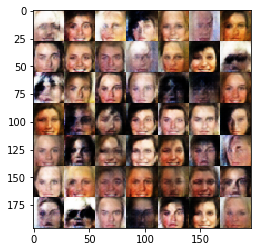

Epoch 1/1... Discriminator Loss: 1.2710... Generator Loss: 0.7462
Epoch 1/1... Discriminator Loss: 1.2197... Generator Loss: 0.8237
Epoch 1/1... Discriminator Loss: 1.3373... Generator Loss: 0.6754
Epoch 1/1... Discriminator Loss: 1.3547... Generator Loss: 0.6659
Epoch 1/1... Discriminator Loss: 1.3596... Generator Loss: 0.7061
Epoch 1/1... Discriminator Loss: 1.4474... Generator Loss: 0.8341
Epoch 1/1... Discriminator Loss: 1.2122... Generator Loss: 0.7515
Epoch 1/1... Discriminator Loss: 1.3462... Generator Loss: 0.7373
Epoch 1/1... Discriminator Loss: 1.2450... Generator Loss: 0.6444
Epoch 1/1... Discriminator Loss: 1.2316... Generator Loss: 0.8077
Epoch 1/1... Discriminator Loss: 1.3235... Generator Loss: 0.6995
Epoch 1/1... Discriminator Loss: 0.9210... Generator Loss: 1.2980


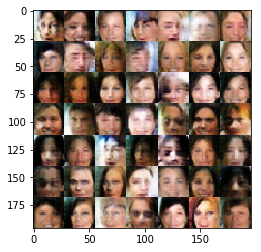

Epoch 1/1... Discriminator Loss: 1.4131... Generator Loss: 0.6976
Epoch 1/1... Discriminator Loss: 1.1276... Generator Loss: 0.8703
Epoch 1/1... Discriminator Loss: 1.2600... Generator Loss: 0.5626
Epoch 1/1... Discriminator Loss: 1.3192... Generator Loss: 0.6194
Epoch 1/1... Discriminator Loss: 1.3628... Generator Loss: 0.9622
Epoch 1/1... Discriminator Loss: 1.3394... Generator Loss: 0.7311
Epoch 1/1... Discriminator Loss: 1.2145... Generator Loss: 0.7441
Epoch 1/1... Discriminator Loss: 1.2782... Generator Loss: 0.7012
Epoch 1/1... Discriminator Loss: 1.3484... Generator Loss: 0.7465
Epoch 1/1... Discriminator Loss: 1.4504... Generator Loss: 0.6761
Epoch 1/1... Discriminator Loss: 1.2646... Generator Loss: 0.6584
Epoch 1/1... Discriminator Loss: 1.4468... Generator Loss: 0.8277


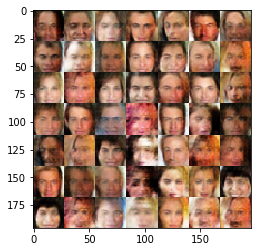

Epoch 1/1... Discriminator Loss: 1.4151... Generator Loss: 0.8679
Epoch 1/1... Discriminator Loss: 1.2120... Generator Loss: 0.9608
Epoch 1/1... Discriminator Loss: 1.3481... Generator Loss: 0.8458
Epoch 1/1... Discriminator Loss: 1.0202... Generator Loss: 1.1045
Epoch 1/1... Discriminator Loss: 1.0612... Generator Loss: 1.1551
Epoch 1/1... Discriminator Loss: 1.4243... Generator Loss: 0.8891
Epoch 1/1... Discriminator Loss: 1.0496... Generator Loss: 0.7794
Epoch 1/1... Discriminator Loss: 1.3908... Generator Loss: 0.6615
Epoch 1/1... Discriminator Loss: 1.4163... Generator Loss: 0.4852
Epoch 1/1... Discriminator Loss: 1.3472... Generator Loss: 0.5738
Epoch 1/1... Discriminator Loss: 1.2983... Generator Loss: 0.7248
Epoch 1/1... Discriminator Loss: 1.0501... Generator Loss: 0.9868


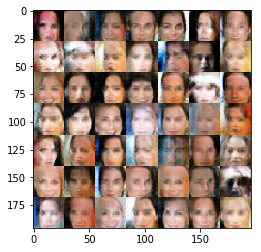

Epoch 1/1... Discriminator Loss: 1.3465... Generator Loss: 0.7492
Epoch 1/1... Discriminator Loss: 1.4483... Generator Loss: 0.6534
Epoch 1/1... Discriminator Loss: 1.1431... Generator Loss: 0.8239
Epoch 1/1... Discriminator Loss: 1.3275... Generator Loss: 0.8855
Epoch 1/1... Discriminator Loss: 1.2528... Generator Loss: 0.8395
Final : Discriminator Loss: 1.2528... Generator Loss: 0.8395


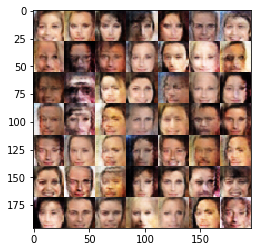

In [15]:
batch_size = 24
z_dim = 100
learning_rate = 0.0005
beta1 = 0.3

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.